In [1]:
%matplotlib inline

In [2]:
import pandas as pd
import os
import shutil
from Bio import SeqIO
from Bio import AlignIO
import distance
import editdistance
import math
import subprocess
import numpy as np
import re
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import collections
import pybedtools
import joblib
import itertools as it
import pathlib
import scipy
import sys
sys.modules['sklearn.externals.joblib'] = joblib
from sklearn.externals.joblib import Parallel, delayed
from matplotlib.ticker import FormatStrFormatter
import matplotlib.ticker as ticker

In [3]:
import plotly.express as px

In [4]:
#Input species name based on the 
#Species_DICT= {}
#Species_DICT['APSI']= 'APSI'
Species = 'Pgt_21'
GENOME_PATH = os.path.abspath('../Mating_type/genome/seperate_haplotype/')
YN00_PATH = os.path.join(GENOME_PATH, 'yn00.ctl')
############yn00.ctl file:###############################
#seqfile = cds_codon.aln * sequence data file name
#outfile = yn.out * main result file
#verbose = 0 * 1: detailed output (list sequences), 0: concise output
#icode = 0 * 0:universal code; 1:mammalian mt; 2-10:see below
#weighting = 0 * weighting pathways between codons (0/1)?
#commonf3x4 = 0 * use one set of codon freqs for all pairs (0/1)?


In [5]:
Species_Path = os.path.join(GENOME_PATH, '%s' % Species)
if not os.path.exists(Species_Path):
       os.mkdir(os.path.join(GENOME_PATH, '%s' % Species))
BASE_OUT_PATH = os.path.join(Species_Path, 'output')
FIGURE_PATH = os.path.join(Species_Path, 'figures')
if not os.path.exists(FIGURE_PATH):
    os.mkdir(FIGURE_PATH)
if not os.path.exists(BASE_OUT_PATH):
    os.mkdir(BASE_OUT_PATH)

In [6]:
PAML_PATH = os.path.join(Species_Path, 'paml')
if not os.path.exists(PAML_PATH):
       os.mkdir(os.path.join(Species_Path, 'paml'))
shutil.copy2(YN00_PATH, PAML_PATH)

'/home/zhenyan/Mating_type/genome/seperate_haplotype/Pgt_21/paml/yn00.ctl'

In [9]:
#copy neccessary files to corresponding species_path
#for key, value in Species_DICT.items():
#    Species_Path = os.path.join(GENOME_PATH, '%s' % value)
#    shutil.copy2(GENOME_PATH + '/' + key + '_h.faa' , Species_Path)
#    shutil.copy2(GENOME_PATH + '/' + key + '_p.faa' , Species_Path) 
shutil.copy2(GENOME_PATH + '/' + Species + '_h.faa' , Species_Path)
shutil.copy2(GENOME_PATH + '/' + Species + '_p.faa' , Species_Path) 
shutil.copy2(GENOME_PATH + '/' + Species + '_h.gff' , Species_Path)
shutil.copy2(GENOME_PATH + '/' + Species + '_p.gff' , Species_Path) 
shutil.copy2(GENOME_PATH + '/' + Species + '_h.cds' , Species_Path)
shutil.copy2(GENOME_PATH + '/' + Species + '_p.cds' , Species_Path) 

'/home/zhenyan/Mating_type/genome/seperate_haplotype/Pgt_21/Pgt_21_p.cds'

##### Run Orthofinder
```
for key, value in Species_DICT.items():
        Species_Path = os.path.join(GENOME_PATH, '%s' % key)
        OF_options = ['-f']
        OF_options.append(Species_Path)
        OF_options.append('-t 16')
        OF_command = 'orthofinder %s' % ' '.join(OF_options)
        print(OF_command)
       subprocess.check_output(OF_command, shell=True, stderr=subprocess.STDOUT)
OF_options = ['-f']
OF_options.append(Species_Path)
OF_options.append('-t 16')
OF_command = 'orthofinder %s' % ' '.join(OF_options)
print(OF_command)
subprocess.check_output(OF_command, shell=True, stderr=subprocess.STDOUT)
```
```
Species_Ortho_Path = os.path.join(Species_Path, 'OrthoFinder', 'Results_Jul29')
Orthogroups_df = os.path.join(Species_Ortho_Path, 'Orthogroups') 
OG_Genecount = pd.read_csv(os.path.join(Orthogroups_df, 'Orthogroups.GeneCount.tsv'), sep='\t', header='infer')
#classify into three types, primary = haploid, primary < haploid, primary > haploid
total_gene_count = OG_Genecount['Total'].sum()
OG_p_uniq = OG_Genecount.loc[(OG_Genecount['%s_h' % Species] == 0)]
sum_OG_p_uniq = OG_p_uniq['%s_p' % Species].sum() 
OG_h_uniq = OG_Genecount.loc[(OG_Genecount['%s_p' % Species] == 0)]
sum_OG_h_uniq = OG_h_uniq['%s_h' % Species].sum() 
OG_Genecount.loc[OG_Genecount['%s_h' % Species] < OG_Genecount['%s_p' % Species]]
print('Total numbers of genes: %s' % total_gene_count)
print('Total numbers of orthogroup: %s' % len(OG_Genecount))
print('Total numbers of orthogroup unique in primary assembly: %s' % len(OG_p_uniq))
print('Total numbers of genes unique in primary assembly: %s' % sum_OG_p_uniq)
print('Total numbers of orthogroup unique in haploid assembly: %s' % len(OG_h_uniq))
print('Total numbers of genes unique in haploid assembly: %s' % sum_OG_h_uniq)
```

In [13]:
#Define output folder for proteinortho, although proteinortho generate output file in the same folder as this script
PROTEINORTHO_OUT_PATH = os.path.join(Species_Path, 'proteinortho')
if not os.path.exists(PROTEINORTHO_OUT_PATH):
    os.mkdir(PROTEINORTHO_OUT_PATH)
def getortho(species):
    !proteinortho6.pl -synteny -cpus=16 -singles -project={species} /home/zhenyan/Mating_type/genome/seperate_haplotype/{species}/{species}_p.faa /home/zhenyan/Mating_type/genome/seperate_haplotype/{species}/{species}_h.faa
    return getortho
getortho(Species)
shutil.copy2(Species + '.proteinortho.tsv' , PROTEINORTHO_OUT_PATH)
shutil.copy2(Species + '.poff-graph' , PROTEINORTHO_OUT_PATH)
shutil.copy2(Species + '.poff.tsv' , PROTEINORTHO_OUT_PATH)

*****************************************************************
Proteinortho with PoFF version 6.0.31 - An orthology detection tool
*****************************************************************
Using 16 CPU threads, Detected 'diamond' version 2.0.11
Checking input files.
Checking /home/zhenyan/Mating_type/genome/seperate_haplotype/Pgt_21/Pgt_21_p.faa... /home/zhenyan/Mating_type/genome/seperate_haplotype/Pgt_21/Pgt_21_p.faa	19164 genes	ok
Checking /home/zhenyan/Mating_type/genome/seperate_haplotype/Pgt_21/Pgt_21_h.faa...  [WARNING] Found empty line in /home/zhenyan/Mating_type/genome/seperate_haplotype/Pgt_21/Pgt_21_h.faa, removing it with perl -lne./home/zhenyan/Mating_type/genome/seperate_haplotype/Pgt_21/Pgt_21_h.faa	18843 genes	ok

**Step 1**
Generating indices.
Building database for '/home/zhenyan/Mating_type/genome/seperate_haplotype/Pgt_21/Pgt_21_p.faa'	(19164 sequences)
Building database for '/home/zhenyan/Mating_type/genome/seperate_haplotype/Pgt_21/Pgt_21_h.faa'	(18843 

'/home/zhenyan/Mating_type/genome/seperate_haplotype/Pgt_21/proteinortho/Pgt_21.poff.tsv'

In [14]:
proteinortho = pd.read_csv(os.path.join(PROTEINORTHO_OUT_PATH, Species + '.proteinortho.tsv'), sep='\t', header='infer')
graph_header= ['Target', 'Query', 'evalue_ab', 'bitscore_ab', 'evalue_ba', 'bitscore_ba', 'same_strand' , 'simscore']
poff_graph = pd.read_csv(os.path.join(PROTEINORTHO_OUT_PATH, Species + '.poff-graph'), sep='\t', names=graph_header, header=None, comment='#')
poff_tsv = pd.read_csv(os.path.join(PROTEINORTHO_OUT_PATH, Species + '.poff.tsv'), sep='\t', header='infer')

In [15]:
proorthograph_fh=os.path.join(PROTEINORTHO_OUT_PATH, Species + '.proteinortho.tsv')
poff_graph_fh=os.path.join(PROTEINORTHO_OUT_PATH, Species + '.poff-graph')

In [17]:
combine_p_h_faa = 'cat %s %s >%s' % (Species_Path + '/' + Species + '_p.faa', Species_Path + '/' + Species + '_h.faa', Species_Path + '/' + Species + '_ph.faa')
combine_p_h_cds = 'cat %s %s >%s' % (Species_Path + '/' + Species + '_p.cds', Species_Path + '/' + Species + '_h.cds', Species_Path + '/' + Species + '_ph.cds')
subprocess.check_output(combine_p_h_faa, shell=True, stderr=subprocess.STDOUT)
subprocess.check_output(combine_p_h_cds, shell=True, stderr=subprocess.STDOUT)

b''

In [18]:
def getFastaDict(fastaFile):
    d = {}
    for gene in SeqIO.parse(fastaFile, 'fasta'):
        d[gene.id] = gene
    return d

In [19]:
PH_PROTEIN_FASTA = os.path.join(Species_Path + '/' + Species + '_ph.faa')
PH_CDS_FASTA = os.path.join(Species_Path + '/' + Species + '_ph.cds')
SEQRECORD_PROTEIN_DICT = getFastaDict(PH_PROTEIN_FASTA)
SEQRECORD_CDS_DICT = getFastaDict(PH_CDS_FASTA)
threads = 8

In [20]:
#poff_graph=open(poff_graph_fh).readlines()
#graph_header= ['Target', 'Query', 'evalue_ab', 'bitscore_ab', 'evalue_ba', 'bitscore_ba', 'same_strand' , 'simscore']
#po_df = pd.read_csv(poff_graph_fh, sep='\t', header=None, names=graph_header, comment='#' )

In [21]:
def writeAllelicFasta(alleleOne, alleleTwo, alleleType, outPath):
    '''writes fasta file containing fasta information for two alleles
    in the outPath'''
    assert(alleleType.upper() in ['CDS', 'GENE', 'PROTEIN'])
    seqRecordDict = globals()['SEQRECORD_' + alleleType.upper() + '_DICT']
    try:
        alleleSeqRecords = [seqRecordDict[alleleOne], seqRecordDict[alleleTwo]]
    except KeyError:
        print(alleleOne)
        print(alleleTwo)
        print(alleleType)
        sys.exit()
    with open(os.path.join(outPath, alleleType.lower() + '.fa'), 'w') as outFile:
        SeqIO.write(alleleSeqRecords, outFile, 'fasta')
    return True

In [22]:
# Define paml_script.sh
def writeAlignmentScript(alleleOutPath, scriptLoc = os.path.join(PAML_PATH, 'paml_script.sh')):
    with open(scriptLoc, 'a') as outFile:
        print('cd %s' % alleleOutPath, file=outFile)
        print('muscle -clwstrict -in protein.fa -out protein.aln', file=outFile)
        print('pal2nal.pl -output paml protein.aln cds.fa > cds_codon.aln', file=outFile)
        print('pal2nal.pl protein.aln cds.fa > cds_codon.clustal', file=outFile)
        print('cp %s/yn00.ctl ./' % PAML_PATH, file=outFile)
        print('yn00', file=outFile)
    return True

In [23]:
def prepareAlignmentBashScript(scriptLoc = os.path.join(PAML_PATH, 'paml_script.sh')):
    with open(scriptLoc, 'w') as pamlScript:
        print('#!/bin/bash', file=pamlScript)

    for index, [Query, Target] in alleleDf.iloc[:, :2].iterrows():
        #if we don't have a blast hit skip.
        if pd.isnull(Target):
            continue
        else:
            alleleOutPath = os.path.join(PAML_PATH, '%s_%s' % (Query, Target))
            if not os.path.exists(alleleOutPath):
                os.mkdir(os.path.join(PAML_PATH, '%s_%s' % (Query, Target)))
            writeAllelicFasta(Query, Target, 'CDS', alleleOutPath)
            writeAllelicFasta(Query, Target, 'PROTEIN', alleleOutPath)
            writeAlignmentScript(alleleOutPath, os.path.join(PAML_PATH, 'paml_script.sh'))
    return True

In [24]:
alleleDf = poff_graph.copy()
alleleDf['folder'] = alleleDf.Target + '_' + alleleDf.Query
alleleDf.set_index('folder', inplace=True)

In [25]:
prepareAlignmentBashScript(os.path.join(PAML_PATH, 'paml_script.sh'))

True

In [26]:
#run paml script
!bash {os.path.join(PAML_PATH, 'paml_script.sh')}


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 402, max 500, avg 451
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1500
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      402 /      402 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.15

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2433
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      811 /      811 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.17

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 176, max 176, avg 176
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1869
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      621 /      621 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.32

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 730, max 730, avg 730
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 643, max 656, avg 649
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2055
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      614 /      614 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.32

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1122
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      374 /      374 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.27

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 632, max 636, avg 634
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 423
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      136 /      136 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.68

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 911, max 912, avg 911
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 486, max 486, avg 486
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1458
Reading sequences, sequential format..
Counting site patterns..  0:00
          96 patterns at      486 /      486 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.58

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1251
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      416 /      416 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.85

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 137, max 147, avg 142
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 224, max 224, avg 224
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 672
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      224 /      224 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.11

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1008
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      336 /      336 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.67

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 231, max 242, avg 236
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 387, max 387, avg 387
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1161
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      387 /      387 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 402
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at       91 /       91 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 137, max 139, avg 138
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3006
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at     1002 /     1002 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 91, max 91, avg 91
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01  

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1488
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      496 /      496 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.53

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 100, max 148, avg 124
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 208, max 208, avg 208
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 624
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      208 /      208 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.61

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 774
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      258 /      258 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 133, max 133, avg 133
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 400, max 400, avg 400
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1200
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      400 /      400 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2061
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      686 /      686 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 135, max 136, avg 135
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 142, max 223, avg 182
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 669
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      142 /      142 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.85

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2301
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      767 /      767 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.25

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 100, max 115, avg 107
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 358, max 360, avg 359
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1083
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      357 /      357 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1053
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      351 /      351 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.19

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 343, max 363, avg 353
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1305
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      435 /      435 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.31

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 141, max 141, avg 141
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1695
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      549 /      549 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1018, max 1020, avg 1019
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 70, max 128, avg 99
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 384
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at       70 /       70 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.40

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2616
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      872 /      872 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.55

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 56, max 80, avg 68
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00  

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1359
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      310 /      310 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.16

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 331, max 331, avg 331
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 467, max 476, avg 471
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1428
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      467 /      467 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.58

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1347
Reading sequences, sequential format..
Counting site patterns..  0:00
          99 patterns at      387 /      387 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 524, max 534, avg 529
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 520, max 558, avg 539
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1674
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      520 /      520 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 513
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      171 /      171 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 636, max 636, avg 636
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 504
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      130 /      130 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.15

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 214, max 214, avg 214
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 333
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at       64 /       64 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.65

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 122, max 122, avg 122
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1098
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      366 /      366 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 266, max 266, avg 266
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1023
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      335 /      335 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.45

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 407, max 407, avg 407
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2259
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      722 /      722 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.50

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1486, max 1487, avg 1486
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 963
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      321 /      321 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 283, max 305, avg 294
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1173
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      387 /      387 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 113, max 113, avg 113
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 359, max 360, avg 359
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1080
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      359 /      359 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.67

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WA

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 912
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      300 /      300 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 66, max 70, avg 68
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pam

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1194
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      398 /      398 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.44

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 340, max 626, avg 483
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 243
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at       81 /       81 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 163, max 171, avg 167
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 633
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      189 /      189 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.52

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 282, max 282, avg 282
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 151, max 209, avg 180
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 627
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      151 /      151 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 534
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      154 /      154 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 241, max 241, avg 241
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1986
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      662 /      662 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 59, max 63, avg 61
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 900
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      285 /      285 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.86

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 755, max 755, avg 755
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1143
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      328 /      328 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.51

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 433, max 433, avg 433
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1599
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      500 /      500 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.51

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 83, max 83, avg 83
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 122, max 198, avg 160
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 594
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at      122 /      122 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1635
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at      540 /      540 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.30

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 253, max 253, avg 253
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1560
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      520 /      520 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.63

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 417, max 661, avg 539
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 275, max 279, avg 277
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 837
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      275 /      275 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.92

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 975
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      184 /      184 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 518, max 519, avg 518
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3972
Reading sequences, sequential format..
Counting site patterns..  0:00
         233 patterns at      788 /      788 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.84

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 803, max 803, avg 803
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 87, max 87, avg 87
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 261
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       87 /       87 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 285
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at       95 /       95 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.62

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 214, max 214, avg 214
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 166, max 172, avg 169
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 516
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      166 /      166 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1578
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      410 /      410 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 144, max 144, avg 144
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1038
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      346 /      346 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 784, max 831, avg 807
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 493, max 494, avg 493
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1482
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      493 /      493 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.70

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 285
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at       54 /       54 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.25

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 51, max 52, avg 51
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pam


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 708, max 721, avg 714
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2169
Reading sequences, sequential format..
Counting site patterns..  0:00
         108 patterns at      706 /      706 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WA

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 399
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      133 /      133 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 17.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 58, max 58, avg 58
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2250
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      750 /      750 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 751, max 753, avg 752
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1185
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      394 /      394 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 946, max 946, avg 946
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 654
Reading sequences, sequential format..
Counting site patterns..  0:00
         148 patterns at      177 /      177 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 592, max 592, avg 592
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 55, max 69, avg 62
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 219
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at       51 /       51 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.89

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 765
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      253 /      253 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.31

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 189, max 189, avg 189
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 747, max 773, avg 760
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2385
Reading sequences, sequential format..
Counting site patterns..  0:00
         291 patterns at      725 /      725 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.37

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2667
Reading sequences, sequential format..
Counting site patterns..  0:00
         103 patterns at      888 /      888 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.57

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 366, max 366, avg 366
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1608
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      525 /      525 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.46

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 203, max 281, avg 242
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2379
Reading sequences, sequential format..
Counting site patterns..  0:00
         104 patterns at      788 /      788 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 345, max 347, avg 346
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 445, max 512, avg 478
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1569
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      434 /      434 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.38

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2919
Reading sequences, sequential format..
Counting site patterns..  0:00
          89 patterns at      542 /      542 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 543, max 543, avg 543
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 544, max 574, avg 559
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1722
Reading sequences, sequential format..
Counting site patterns..  0:00
          98 patterns at      544 /      544 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 486
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      162 /      162 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 719, max 719, avg 719
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 610, max 629, avg 619
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1887
Reading sequences, sequential format..
Counting site patterns..  0:00
         121 patterns at      610 /      610 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.44

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1884
Reading sequences, sequential format..
Counting site patterns..  0:00
          89 patterns at      626 /      626 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 165, max 165, avg 165
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 115, max 228, avg 171
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 684
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      115 /      115 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.77

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WAR

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1305
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      435 /      435 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 619, max 619, avg 619
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 249
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at       61 /       61 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 501, max 522, avg 511
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 354, max 355, avg 354
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1065
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      354 /      354 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.80

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1023
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      341 /      341 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 10.72

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 276, max 276, avg 276
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 i

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 276
Reading sequences, sequential format..
Counting site patterns..  0:00
          37 patterns at       64 /       64 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 90, max 90, avg 90
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pam

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 528
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at       90 /       90 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 88, max 95, avg 91
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pam

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 567
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      189 /      189 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 470, max 560, avg 515
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1656
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      552 /      552 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 195, max 252, avg 223
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 672
Reading sequences, sequential format..
Counting site patterns..  0:00
         103 patterns at      221 /      221 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.17

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 73, max 133, avg 103
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in p

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 684
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      228 /      228 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 77, max 77, avg 77
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00   

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 576
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      192 /      192 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.47

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 488, max 488, avg 488
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 104, max 106, avg 105
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 318
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      104 /      104 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.32

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 759
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      253 /      253 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1087, max 1087, avg 1087
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 552
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      182 /      182 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.66

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 820, max 820, avg 820
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 273, max 273, avg 273
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 819
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      273 /      273 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1278
Reading sequences, sequential format..
Counting site patterns..  0:00
          85 patterns at      426 /      426 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.66

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 119, max 181, avg 150
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 990
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      328 /      328 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 230, max 305, avg 267
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1455
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      485 /      485 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.20

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 287, max 287, avg 287
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 208, max 241, avg 224
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 723
Reading sequences, sequential format..
Counting site patterns..  0:00
          98 patterns at      208 /      208 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.49

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1416
Reading sequences, sequential format..
Counting site patterns..  0:00
         210 patterns at      413 /      413 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.16

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 606, max 668, avg 637
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1341
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      447 /      447 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 241, max 243, avg 242
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1554
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at      517 /      517 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.58

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 485, max 673, avg 579
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1704
Reading sequences, sequential format..
Counting site patterns..  0:00
         127 patterns at      548 /      548 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 159, max 159, avg 159
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 213
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at       71 /       71 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 764, max 783, avg 773
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1080
Reading sequences, sequential format..
Counting site patterns..  0:00
         104 patterns at      237 /      237 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 497, max 628, avg 562
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 110, max 119, avg 114
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 357
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at      110 /      110 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.37

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 690
Reading sequences, sequential format..
Counting site patterns..  0:00
         136 patterns at      152 /      152 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 802, max 896, avg 849
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 990
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      330 /      330 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.50

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 813, max 899, avg 856
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1584
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      502 /      502 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 337, max 337, avg 337
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3402
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at      950 /      950 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.37

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 962, max 963, avg 962
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1011
Reading sequences, sequential format..
Counting site patterns..  0:00
         111 patterns at      282 /      282 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 250, max 250, avg 250
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:0


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 931, max 931, avg 931
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2793
Reading sequences, sequential format..
Counting site patterns..  0:00
          87 patterns at      931 /      931 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WA

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1617
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      538 /      538 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 600, max 600, avg 600
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 984
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      304 /      304 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 448, max 448, avg 448
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1914, max 1975, avg 1944
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    30 MB(15%)  Iter   1  100.00%  Align node       
00:00:00    30 MB(15%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5961
Reading sequences, sequential format..
Counting site patterns..  0:00
         181 patterns at     1902 /     1902 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.55

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUS

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 234
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       78 /       78 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 312, max 312, avg 312
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1944
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      409 /      409 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.33

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1427, max 1493, avg 1460
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 390
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      114 /      114 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 417, max 417, avg 417
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 627
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      209 /      209 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 112, max 112, avg 112
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 258
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at       86 /       86 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 892, max 892, avg 892
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1095
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      365 /      365 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.25

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 593, max 593, avg 593
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 85, max 101, avg 93
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 303
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at       85 /       85 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.61

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2760
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at      872 /      872 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 199, max 200, avg 199
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 207, max 207, avg 207
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 621
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      207 /      207 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1782
Reading sequences, sequential format..
Counting site patterns..  0:00
         112 patterns at      588 /      588 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.58

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1418, max 1418, avg 1418
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 252, max 369, avg 310
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1107
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      252 /      252 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1347
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      449 /      449 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.51

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 481, max 481, avg 481
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1713
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      571 /      571 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 82, max 82, avg 82
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 479, max 488, avg 483
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1464
Reading sequences, sequential format..
Counting site patterns..  0:00
          87 patterns at      479 /      479 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.77

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 561
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      187 /      187 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.47

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 102, max 148, avg 125
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1044, max 1056, avg 1050
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3168
Reading sequences, sequential format..
Counting site patterns..  0:00
         112 patterns at     1044 /     1044 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.42

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUS

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1818
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      448 /      448 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.20

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 539, max 539, avg 539
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2340
Reading sequences, sequential format..
Counting site patterns..  0:00
          85 patterns at      780 /      780 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.26

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 52, max 52, avg 52
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00  

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 945
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      315 /      315 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.89

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 332, max 423, avg 377
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 222, max 225, avg 223
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 678
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      221 /      221 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.89

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2115
Reading sequences, sequential format..
Counting site patterns..  0:00
         105 patterns at      447 /      447 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.52

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 569, max 569, avg 569
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1314
Reading sequences, sequential format..
Counting site patterns..  0:00
         140 patterns at      265 /      265 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.71

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 269, max 449, avg 359
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 354
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at       97 /       97 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.15

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 427, max 427, avg 427
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1452
Reading sequences, sequential format..
Counting site patterns..  0:00
         188 patterns at      372 /      372 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 134, max 136, avg 135
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 71, max 71, avg 71
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 213
Reading sequences, sequential format..
Counting site patterns..  0:00
          34 patterns at       71 /       71 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1497
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      476 /      476 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 698, max 698, avg 698
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 759
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      207 /      207 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 381, max 381, avg 381
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 2032, max 2034, avg 2033
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    31 MB(16%)  Iter   1  100.00%  Align node       
00:00:00    31 MB(16%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 6105
Reading sequences, sequential format..
Counting site patterns..  0:00
         132 patterns at     2031 /     2031 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUS

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1293
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      225 /      225 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.70

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 223, max 223, avg 223
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 474, max 474, avg 474
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1422
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      474 /      474 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 423
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at       81 /       81 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.85

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 345, max 360, avg 352
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

00:00:00    29 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    29 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5304
Reading sequences, sequential format..
Counting site patterns..  0:00
         110 patterns at     1689 /     1689 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.70

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 190, max 190, avg 190
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 636
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      186 /      186 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1748, max 1748, avg 1748
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1050
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      301 /      301 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.55

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1155, max 1155, avg 1155
00:00:01    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:01    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1168, max 1173, avg 1170
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:01    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3525
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at     1166 /     1166 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.45

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUS

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1332
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      253 /      253 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.71

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 930, max 930, avg 930
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1461
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      487 /      487 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 191, max 191, avg 191
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 915
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      303 /      303 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.50

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 60, max 72, avg 66
00:00:00   



ns = 2  	ls = 588
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      196 /      196 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 127, max 129, avg 128
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2265
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      755 /      755 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 653, max 653, avg 653
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1131
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      285 /      285 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 119, max 121, avg 120
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2739
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at      913 /      913 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 126, max 126, avg 126
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 283, max 286, avg 284
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 858
Reading sequences, sequential format..
Counting site patterns..  0:00
         175 patterns at      283 /      283 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1011
Reading sequences, sequential format..
Counting site patterns..  0:00
          94 patterns at      337 /      337 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.19

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 58, max 60, avg 59
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1680
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      559 /      559 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.50

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 336, max 336, avg 336
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 2336, max 2336, avg 2336
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    33 MB(17%)  Iter   1  100.00%  Align node       
00:00:00    33 MB(17%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 7008
Reading sequences, sequential format..
Counting site patterns..  0:00
         113 patterns at     2336 /     2336 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.14

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUS

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 696
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      232 /      232 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.22

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 349, max 396, avg 372
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1632
Reading sequences, sequential format..
Counting site patterns..  0:00
          88 patterns at      544 /      544 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.87

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1113, max 1113, avg 1113
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 187, max 187, avg 187
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 561
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      187 /      187 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 906
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      223 /      223 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.53

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 469, max 469, avg 469
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 936
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      312 /      312 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 118, max 152, avg 135
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 116, max 138, avg 127
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 414
Reading sequences, sequential format..
Counting site patterns..  0:00
          90 patterns at      116 /      116 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WAR

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 969
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      323 /      323 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.53

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 524, max 527, avg 525
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 854, max 856, avg 855
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2568
Reading sequences, sequential format..
Counting site patterns..  0:00
          93 patterns at      854 /      854 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.36

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 402
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      129 /      129 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.43

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 196, max 214, avg 205
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 417
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      139 /      139 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 2243, max 2244, avg 2243
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    33 MB(16%)  Iter   1  100.00%  Align node       
00:00:00    33 MB(16%)  Iter   1  100.00%  Root alignment
YN00 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 715, max 716, avg 715
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2151
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      714 /      714 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.43

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 561
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      180 /      180 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.76

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 502, max 502, avg 502
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1335
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      445 /      445 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 10.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 94, max 94, avg 94
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in p

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1458
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      426 /      426 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 115, max 115, avg 115
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1587
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      529 /      529 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 324, max 324, avg 324
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 114, max 114, avg 114
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 342
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at      114 /      114 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 927
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      309 /      309 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.40

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 174, max 229, avg 201
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 100, max 100, avg 100
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 300
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      100 /      100 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.46

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 405
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      135 /      135 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 183, max 183, avg 183
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 486, max 531, avg 508
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1593
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      486 /      486 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.32

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2982
Reading sequences, sequential format..
Counting site patterns..  0:00
         549 patterns at      951 /      951 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.29

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 240, max 263, avg 251
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 483
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      161 /      161 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 217, max 219, avg 218
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1272
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      424 /      424 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 396, max 524, avg 460
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2292
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      764 /      764 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 10.40

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 512, max 512, avg 512
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2583
Reading sequences, sequential format..
Counting site patterns..  0:00
         109 patterns at      860 /      860 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.38

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 212, max 212, avg 212
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1179, max 1208, avg 1193
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3630
Reading sequences, sequential format..
Counting site patterns..  0:00
         103 patterns at     1177 /     1177 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


***

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 756
Reading sequences, sequential format..
Counting site patterns..  0:00
         150 patterns at      166 /      166 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.26

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 305, max 305, avg 305
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 666
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      222 /      222 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 802, max 802, avg 802
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 386, max 386, avg 386
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1158
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      386 /      386 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.38

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2226
Reading sequences, sequential format..
Counting site patterns..  0:00
         135 patterns at      726 /      726 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 111, max 131, avg 121
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 657
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      111 /      111 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 156, max 158, avg 157
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 622, max 881, avg 751
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2643
Reading sequences, sequential format..
Counting site patterns..  0:00
         105 patterns at      622 /      622 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 615
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      205 /      205 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 391, max 391, avg 391
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1758
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at      586 /      586 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.76

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 114, max 114, avg 114
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 582
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      194 /      194 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 153, max 153, avg 153
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1497
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      499 /      499 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 214, max 216, avg 215
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1363, max 1381, avg 1372
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4143
Reading sequences, sequential format..
Counting site patterns..  0:00
          99 patterns at     1363 /     1363 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.29

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUS

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1335
Reading sequences, sequential format..
Counting site patterns..  0:00
         296 patterns at      409 /      409 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.56

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 62, max 68, avg 65
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1824
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      323 /      323 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.81

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 751, max 864, avg 807
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 636
Reading sequences, sequential format..
Counting site patterns..  0:00
         137 patterns at      149 /      149 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.83

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 138, max 155, avg 146
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1083
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      341 /      341 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 476, max 476, avg 476
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 411
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      133 /      133 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.57

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 339, max 339, avg 339
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1119
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      373 /      373 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.89

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 454, max 455, avg 454
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1770
Reading sequences, sequential format..
Counting site patterns..  0:00
         100 patterns at      590 /      590 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.31

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 93, max 115, avg 104
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1554
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      518 /      518 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 53, max 69, avg 61
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00  


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 234, max 384, avg 309
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1152
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      234 /      234 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 765
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      255 /      255 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.53

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 340, max 340, avg 340
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 90, max 91, avg 90
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 273
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at       90 /       90 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNIN

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 291
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at       97 /       97 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 110, max 135, avg 122
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 318, max 318, avg 318
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 954
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      318 /      318 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.33

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 645
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      215 /      215 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 308, max 308, avg 308
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 357
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      119 /      119 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 172, max 188, avg 180
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 336
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at       76 /       76 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.22

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 265, max 265, avg 265
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1278
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      426 /      426 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.74

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 505, max 517, avg 511
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 122, max 122, avg 122
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 366
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      122 /      122 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1065
Reading sequences, sequential format..
Counting site patterns..  0:00
         108 patterns at      174 /      174 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 213, max 213, avg 213
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2598
Reading sequences, sequential format..
Counting site patterns..  0:00
          98 patterns at      858 /      858 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.56

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 154, max 154, avg 154
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 432
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      135 /      135 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1481, max 1481, avg 1481
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 586, max 721, avg 653
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2163
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      586 /      586 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 906
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      302 /      302 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 834, max 841, avg 837
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1257
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      384 /      384 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.78

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1026, max 1374, avg 1200
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:0

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1203
Reading sequences, sequential format..
Counting site patterns..  0:00
         126 patterns at      327 /      327 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.74

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 291, max 371, avg 331
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 606
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      127 /      127 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 101, max 186, avg 143
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 99, max 99, avg 99
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 297
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at       99 /       99 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2268
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      552 /      552 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 583, max 583, avg 583
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 426
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      129 /      129 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 157, max 157, avg 157
00:00:00

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1857
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      244 /      244 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.75

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 282, max 282, avg 282
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 888
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      289 /      289 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.49

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 467, max 467, avg 467
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1230
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      329 /      329 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 115, max 134, avg 124
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2457
Reading sequences, sequential format..
Counting site patterns..  0:00
          98 patterns at      819 /      819 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 403, max 403, avg 403
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 393
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      131 /      131 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 903, max 903, avg 903
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3258
Reading sequences, sequential format..
Counting site patterns..  0:00
         111 patterns at     1083 /     1083 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.13

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1120, max 1120, avg 1120
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 707, max 747, avg 727
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2241
Reading sequences, sequential format..
Counting site patterns..  0:00
         102 patterns at      707 /      707 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3261
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at     1087 /     1087 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.57

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 220, max 220, avg 220
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 456, max 610, avg 533
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1830
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      456 /      456 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.18

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2568
Reading sequences, sequential format..
Counting site patterns..  0:00
         109 patterns at      856 /      856 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.44

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 396, max 398, avg 397
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 250, max 294, avg 272
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 882
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      250 /      250 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.56

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 441
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      145 /      145 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1044, max 1044, avg 1044
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 568, max 573, avg 570
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1722
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at      567 /      567 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.75

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 615
Reading sequences, sequential format..
Counting site patterns..  0:00
         125 patterns at      164 /      164 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 152, max 152, avg 152
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 143, max 144, avg 143
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 432
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at      143 /      143 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.52

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1707
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      569 /      569 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.16

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1518, max 1519, avg 1518
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:01    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 666
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      222 /      222 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 255, max 408, avg 331
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 765
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      254 /      254 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 130, max 131, avg 130
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 437, max 447, avg 442
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1341
Reading sequences, sequential format..
Counting site patterns..  0:00
         151 patterns at      437 /      437 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 378
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      104 /      104 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 83, max 83, avg 83
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pam

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 375
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      115 /      115 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 167, max 167, avg 167
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1254
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      418 /      418 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 204, max 268, avg 236
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 540, max 540, avg 540
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1620
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      540 /      540 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.75

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 756
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      200 /      200 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 221, max 221, avg 221
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1848
Reading sequences, sequential format..
Counting site patterns..  0:00
          89 patterns at      515 /      515 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.86

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 652, max 654, avg 653
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 927
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      309 /      309 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.31

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 97, max 108, avg 102
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1797
Reading sequences, sequential format..
Counting site patterns..  0:00
          85 patterns at      306 /      306 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.24

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 223, max 223, avg 223
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 608, max 608, avg 608
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1824
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      608 /      608 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.44

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2409
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      803 /      803 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 628, max 630, avg 629
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 571, max 618, avg 594
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1857
Reading sequences, sequential format..
Counting site patterns..  0:00
          96 patterns at      570 /      570 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.45

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1320
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      440 /      440 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 15.45

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1157, max 1157, avg 1157
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN0

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2289
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      763 /      763 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.86

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 530, max 530, avg 530
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 381
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      121 /      121 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.67

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 894, max 894, avg 894
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 529, max 532, avg 530
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1596
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      529 /      529 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1530
Reading sequences, sequential format..
Counting site patterns..  0:00
         298 patterns at      379 /      379 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 477, max 733, avg 605
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2238
Reading sequences, sequential format..
Counting site patterns..  0:00
         216 patterns at      563 /      563 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 398, max 456, avg 427
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 335, max 531, avg 433
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1593
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      335 /      335 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.51

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 630
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      210 /      210 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.38

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 423, max 549, avg 486
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2277
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      759 /      759 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.33

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 140, max 207, avg 173
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 312
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      104 /      104 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 136, max 136, avg 136
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:01    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2607
Reading sequences, sequential format..
Counting site patterns..  0:00
          94 patterns at      869 /      869 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.53

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 717, max 717, avg 717
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 229, max 229, avg 229
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 687
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      229 /      229 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.17

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

00:00:01    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2895
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at      927 /      927 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.58

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 750, max 750, avg 750
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 216, max 256, avg 236
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 768
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      216 /      216 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2736
Reading sequences, sequential format..
Counting site patterns..  0:00
         116 patterns at      778 /      778 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.18

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 238, max 241, avg 239
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1212
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      404 /      404 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 550, max 556, avg 553
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 750
Reading sequences, sequential format..
Counting site patterns..  0:00
          87 patterns at      236 /      236 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.37

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 493, max 493, avg 493
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 294, max 294, avg 294
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 882
Reading sequences, sequential format..
Counting site patterns..  0:00
         114 patterns at      294 /      294 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2172
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      717 /      717 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.62

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 280, max 366, avg 323
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 130, max 130, avg 130
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 390
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      130 /      130 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1254
Reading sequences, sequential format..
Counting site patterns..  0:00
          85 patterns at      412 /      412 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.86

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 182, max 182, avg 182
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 987
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      329 /      329 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.75

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 359, max 359, avg 359
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1752
Reading sequences, sequential format..
Counting site patterns..  0:00
         288 patterns at      573 /      573 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 588, max 588, avg 588
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1983
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      661 /      661 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.20

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 391, max 391, avg 391
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1029
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      343 /      343 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 89, max 89, avg 89
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 552
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      105 /      105 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 264, max 298, avg 281
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 415, max 422, avg 418
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1266
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      415 /      415 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.44

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1749
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at      582 /      582 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 632, max 730, avg 681
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 387
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      104 /      104 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 65, max 93, avg 79
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pam

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3288
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at     1023 /     1023 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.11

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 139, max 216, avg 177
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 403, max 427, avg 415
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1281
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      403 /      403 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.42

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3186
Reading sequences, sequential format..
Counting site patterns..  0:00
         106 patterns at     1062 /     1062 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.15

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 631, max 636, avg 633
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 629, max 629, avg 629
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1887
Reading sequences, sequential format..
Counting site patterns..  0:00
          85 patterns at      629 /      629 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 999
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      232 /      232 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.79

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 280, max 303, avg 291
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 210, max 210, avg 210
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 630
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      210 /      210 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.65

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2067
Reading sequences, sequential format..
Counting site patterns..  0:00
         125 patterns at      618 /      618 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.89

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 160, max 160, avg 160
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1116
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      371 /      371 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.31

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 900, max 1073, avg 986
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 762
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      247 /      247 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 452, max 458, avg 455
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 381, max 400, avg 390
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1230
Reading sequences, sequential format..
Counting site patterns..  0:00
          88 patterns at      371 /      371 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 465
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      155 /      155 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 102, max 102, avg 102
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 183
Reading sequences, sequential format..
Counting site patterns..  0:00
          36 patterns at       61 /       61 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 930, max 930, avg 930
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1998
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      666 /      666 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.38

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 967, max 1001, avg 984
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 i

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2850
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      761 /      761 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.77

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 94, max 95, avg 94
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00  

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 984
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      327 /      327 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.73

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 652, max 659, avg 655
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 297
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at       99 /       99 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1722, max 1722, avg 1722
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    29 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    29 MB(14%)  Iter   1  100.00%  Root alignment
YN00 

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 345
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      115 /      115 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 619, max 619, avg 619
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1358, max 1361, avg 1359
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4092
Reading sequences, sequential format..
Counting site patterns..  0:00
         119 patterns at     1355 /     1355 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.40

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


***

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1308
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      436 /      436 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 66, max 68, avg 67
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 744, max 745, avg 744
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2238
Reading sequences, sequential format..
Counting site patterns..  0:00
          87 patterns at      743 /      743 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.45

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1065
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      355 /      355 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 283, max 283, avg 283
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 894
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      257 /      257 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.45

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 561, max 561, avg 561
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 942
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      314 /      314 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 196, max 228, avg 212
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1467
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      401 /      401 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 366, max 366, avg 366
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1413
Reading sequences, sequential format..
Counting site patterns..  0:00
         265 patterns at      392 /      392 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.44

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 573, max 573, avg 573
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 375
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at       71 /       71 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.50

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 120, max 122, avg 121
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 2554, max 2554, avg 2554
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    35 MB(17%)  Iter   1  100.00%  Align node       
00:00:00    35 MB(17%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 7662
Reading sequences, sequential format..
Counting site patterns..  0:00
         106 patterns at     2554 /     2554 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.36

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUS

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 339
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      110 /      110 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.63

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 273, max 274, avg 273
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 840
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      280 /      280 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 796, max 796, avg 796
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4296
Reading sequences, sequential format..
Counting site patterns..  0:00
         144 patterns at     1431 /     1431 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.62

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 980, max 980, avg 980
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1191
Reading sequences, sequential format..
Counting site patterns..  0:00
          88 patterns at      394 /      394 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.89

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 702, max 702, avg 702
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 950, max 950, avg 950
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2850
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      950 /      950 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.55

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1617
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      539 /      539 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 311, max 311, avg 311
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1137
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      379 /      379 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 94, max 94, avg 94
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00  

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2298
Reading sequences, sequential format..
Counting site patterns..  0:00
         105 patterns at      750 /      750 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.56

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 375, max 375, avg 375
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 83, max 105, avg 94
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 315
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at       83 /       83 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1341
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      421 /      421 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 284, max 284, avg 284
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 240
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at       80 /       80 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 365, max 392, avg 378
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 360
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      120 /      120 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.87

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 168, max 168, avg 168
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2100
Reading sequences, sequential format..
Counting site patterns..  0:00
          96 patterns at      681 /      681 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 291, max 416, avg 353
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 867, max 867, avg 867
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2601
Reading sequences, sequential format..
Counting site patterns..  0:00
          87 patterns at      867 /      867 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.24

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1578
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      526 /      526 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.58

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 64, max 66, avg 65
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00  

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 570
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      128 /      128 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.20

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 59, max 73, avg 66
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pam


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 341, max 523, avg 432
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1569
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      341 /      341 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.67

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WA

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2259
Reading sequences, sequential format..
Counting site patterns..  0:00
         110 patterns at      751 /      751 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.78

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 108, max 108, avg 108
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:01    29 MB(15%)  Iter   1  100.00%  Align node       
00:00:01    29 MB(15%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5343
Reading sequences, sequential format..
Counting site patterns..  0:00
         107 patterns at     1777 /     1777 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.59

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 136, max 226, avg 181
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 180, max 181, avg 180
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 546
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      179 /      179 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.46

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 324
Reading sequences, sequential format..
Counting site patterns..  0:00
          38 patterns at       79 /       79 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.72

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 136, max 138, avg 137
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 945
Reading sequences, sequential format..
Counting site patterns..  0:00
         173 patterns at      210 /      210 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 51, max 51, avg 51
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pam

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 240
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at       80 /       80 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 811, max 836, avg 823
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 837
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      279 /      279 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 219, max 219, avg 219
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 264
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at       68 /       68 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.63

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 534, max 538, avg 536
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3357
Reading sequences, sequential format..
Counting site patterns..  0:00
         105 patterns at     1119 /     1119 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.80

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 426, max 463, avg 444
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 331, max 478, avg 404
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1434
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      331 /      331 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.53

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 318
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at       94 /       94 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 466, max 477, avg 471
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 207
Reading sequences, sequential format..
Counting site patterns..  0:00
          37 patterns at       69 /       69 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 183, max 183, avg 183
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 614, max 615, avg 614
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1845
Reading sequences, sequential format..
Counting site patterns..  0:00
          97 patterns at      614 /      614 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.59

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1248
Reading sequences, sequential format..
Counting site patterns..  0:00
          91 patterns at      353 /      353 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 384, max 642, avg 513
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1491
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      496 /      496 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.65

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 260, max 261, avg 260
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 395, max 395, avg 395
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1185
Reading sequences, sequential format..
Counting site patterns..  0:00
          89 patterns at      395 /      395 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.51

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 795
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      256 /      256 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.18

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 243, max 243, avg 243
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 180, max 187, avg 183
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 561
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      180 /      180 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 624
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      208 /      208 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 571, max 571, avg 571
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 375
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      125 /      125 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 745, max 746, avg 745
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 456
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      115 /      115 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 396, max 470, avg 433
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 195
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at       65 /       65 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 785, max 785, avg 785
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 60, max 60, avg 60
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 180
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at       60 /       60 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1725
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      355 /      355 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 564, max 564, avg 564
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 769, max 788, avg 778
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2607
Reading sequences, sequential format..
Counting site patterns..  0:00
         333 patterns at      688 /      688 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.50

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 156
Reading sequences, sequential format..
Counting site patterns..  0:00
          33 patterns at       51 /       51 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1006, max 1006, avg 1006
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 247, max 247, avg 247
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 741
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      247 /      247 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2547
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      849 /      849 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 329, max 329, avg 329
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3243
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at     1056 /     1056 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.13

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 115, max 115, avg 115
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1137
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      379 /      379 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.81

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 73, max 80, avg 76
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2580
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at      858 /      858 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.06

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 150, max 155, avg 152
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 400, max 400, avg 400
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1200
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      400 /      400 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3291
Reading sequences, sequential format..
Counting site patterns..  0:00
         104 patterns at     1093 /     1093 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 18.22

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1692, max 1692, avg 1692
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 380, max 388, avg 384
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1176
Reading sequences, sequential format..
Counting site patterns..  0:00
          89 patterns at      376 /      376 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.92

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 663
Reading sequences, sequential format..
Counting site patterns..  0:00
         138 patterns at      205 /      205 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 168, max 199, avg 183
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 326, max 326, avg 326
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 978
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      326 /      326 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 351
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      116 /      116 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.31

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 290, max 318, avg 304
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 195
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at       65 /       65 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 14.79

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 108, max 108, avg 108
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 261, max 263, avg 262
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 792
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      260 /      260 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WAR

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1407
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      314 /      314 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.55

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 422, max 422, avg 422
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1488
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      496 /      496 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 400, max 494, avg 447
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1377
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      459 /      459 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 217, max 237, avg 227
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 711
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 507
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      157 /      157 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.17

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 512, max 654, avg 583
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 291
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at       97 /       97 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 809, max 1054, avg 931
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 654, max 659, avg 656
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1977
Reading sequences, sequential format..
Counting site patterns..  0:00
         108 patterns at      654 /      654 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.65

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 468
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      155 /      155 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.16

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 690, max 690, avg 690
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 791, max 794, avg 792
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2385
Reading sequences, sequential format..
Counting site patterns..  0:00
         108 patterns at      790 /      790 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.20

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1239
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      212 /      212 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.36

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1027, max 1040, avg 1033
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1020
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      340 /      340 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.32

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 835, max 836, avg 835
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1479
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      420 /      420 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 373, max 422, avg 397
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 254, max 423, avg 338
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1269
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      254 /      254 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.78

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1926
Reading sequences, sequential format..
Counting site patterns..  0:00
          94 patterns at      642 /      642 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.45

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 51, max 51, avg 51
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00  

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1386
Reading sequences, sequential format..
Counting site patterns..  0:00
         109 patterns at      449 /      449 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 105, max 118, avg 111
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1167
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      139 /      139 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.47

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1060, max 1062, avg 1061
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 157, max 231, avg 194
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 693
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      157 /      157 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.59

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1821
Reading sequences, sequential format..
Counting site patterns..  0:00
         108 patterns at      607 /      607 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.76

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 163, max 163, avg 163
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 677, max 677, avg 677
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2037
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      675 /      675 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.29

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WA

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 837
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      206 /      206 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.21

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 116, max 196, avg 156
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1764
Reading sequences, sequential format..
Counting site patterns..  0:00
         154 patterns at      349 /      349 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 105, max 125, avg 115
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1374
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      458 /      458 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 215, max 215, avg 215
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1170
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      390 /      390 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 206, max 246, avg 226
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 443, max 444, avg 443
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1332
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      443 /      443 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 312
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      104 /      104 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.18

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1311, max 1311, avg 1311
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1437
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      479 /      479 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.37

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 230, max 231, avg 230
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2733
Reading sequences, sequential format..
Counting site patterns..  0:00
         138 patterns at      902 /      902 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.27

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 83, max 83, avg 83
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00  

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1386
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      314 /      314 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.46

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 311, max 311, avg 311
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2304
Reading sequences, sequential format..
Counting site patterns..  0:00
         125 patterns at      767 /      767 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.67

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 3234, max 3234, avg 3234
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 984
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      328 /      328 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.17

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 383, max 449, avg 416
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3543
Reading sequences, sequential format..
Counting site patterns..  0:00
          97 patterns at      732 /      732 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.15

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 615, max 624, avg 619
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 417, max 417, avg 417
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1251
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      417 /      417 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2013
Reading sequences, sequential format..
Counting site patterns..  0:00
          89 patterns at      659 /      659 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.85

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 435, max 435, avg 435
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 456
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at       95 /       95 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 131, max 131, avg 131
00:00:01    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:01    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 113, max 113, avg 113
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 339
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      113 /      113 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.45

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1230
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      323 /      323 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 695, max 783, avg 739
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1239
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      395 /      395 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 80, max 94, avg 87
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 675
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      224 /      224 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 610, max 612, avg 611
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 537
Reading sequences, sequential format..
Counting site patterns..  0:00
         107 patterns at      129 /      129 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.13

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 371, max 440, avg 405
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 270, max 270, avg 270
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 810
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      270 /      270 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.31

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 459
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      150 /      150 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.79

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 85, max 85, avg 85
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pam

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2130
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at      710 /      710 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.69

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 292, max 292, avg 292
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3204
Reading sequences, sequential format..
Counting site patterns..  0:00
          85 patterns at     1068 /     1068 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.42

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 979, max 1020, avg 999
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 61, max 102, avg 81
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 306
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at       61 /       61 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.30

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1080
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      360 /      360 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.63

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 462, max 462, avg 462
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1041
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      347 /      347 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 630, max 637, avg 633
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 330
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      106 /      106 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.44

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 362, max 397, avg 379
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1497
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      499 /      499 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 259, max 259, avg 259
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 936
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      312 /      312 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.66

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 540, max 646, avg 593
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 971, max 971, avg 971
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2913
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      971 /      971 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.52

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1485
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      492 /      492 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 542, max 545, avg 543
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 717
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      239 /      239 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.15

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 104, max 104, avg 104
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 252
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at       84 /       84 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.61

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 132, max 132, avg 132
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1251
Reading sequences, sequential format..
Counting site patterns..  0:00
         168 patterns at      316 /      316 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.21

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 60, max 84, avg 72
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1788
Reading sequences, sequential format..
Counting site patterns..  0:00
         101 patterns at      572 /      572 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.11

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 572, max 594, avg 583
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 930
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      310 /      310 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 397, max 600, avg 498
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1674
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      558 /      558 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.41

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 399, max 399, avg 399
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2793
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      931 /      931 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.26

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 243, max 260, avg 251
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 288
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at       89 /       89 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 11.33

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 407, max 407, avg 407
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 420, max 420, avg 420
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1260
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      420 /      420 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 813
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      225 /      225 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 100, max 100, avg 100
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 88, max 142, avg 115
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 426
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at       88 /       88 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.77

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1812
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      433 /      433 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.50

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 306, max 306, avg 306
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 417, max 426, avg 421
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1278
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      417 /      417 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 13.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCL

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1785
Reading sequences, sequential format..
Counting site patterns..  0:00
          96 patterns at      595 /      595 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.78

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 123, max 123, avg 123
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 312, max 317, avg 314
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 951
Reading sequences, sequential format..
Counting site patterns..  0:00
          99 patterns at      312 /      312 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.61

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WAR

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3303
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      784 /      784 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 83, max 83, avg 83
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00  


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 66, max 66, avg 66
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 198
Reading sequences, sequential format..
Counting site patterns..  0:00
          34 patterns at       66 /       66 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 561
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      187 /      187 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 270, max 270, avg 270
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 651
Reading sequences, sequential format..
Counting site patterns..  0:00
         101 patterns at      115 /      115 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.77

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 103, max 128, avg 115
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 606
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      202 /      202 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.14

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 220, max 286, avg 253
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1314
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      438 /      438 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.50

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 541, max 541, avg 541
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2358
Reading sequences, sequential format..
Counting site patterns..  0:00
          89 patterns at      786 /      786 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 449, max 451, avg 450
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 396
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      112 /      112 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.49

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 543, max 543, avg 543
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 945
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      315 /      315 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 69, max 69, avg 69
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pam


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 573, max 574, avg 573
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1722
Reading sequences, sequential format..
Counting site patterns..  0:00
          85 patterns at      573 /      573 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.55

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1962
Reading sequences, sequential format..
Counting site patterns..  0:00
         100 patterns at      653 /      653 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 549, max 549, avg 549
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 373, max 395, avg 384
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1185
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      373 /      373 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1359
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      453 /      453 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 13.36

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 110, max 131, avg 120
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1002
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      334 /      334 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 556, max 556, avg 556
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 117, max 119, avg 118
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 357
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      117 /      117 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.53

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 693
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      190 /      190 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.81

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 99, max 107, avg 103
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in p

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 579
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      129 /      129 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.68

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1013, max 1167, avg 1090
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 382, max 382, avg 382
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1146
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      382 /      382 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.47

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2877
Reading sequences, sequential format..
Counting site patterns..  0:00
          88 patterns at      956 /      956 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.65

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 78, max 121, avg 99
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1065
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      344 /      344 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.29

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 230, max 230, avg 230
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 900
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      300 /      300 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.80

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 292, max 338, avg 315
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 450
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      150 /      150 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 9.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 117, max 118, avg 117
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 194, max 196, avg 195
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 588
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      194 /      194 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2532
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      843 /      843 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.68

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 722, max 741, avg 731
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 684, max 684, avg 684
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2052
Reading sequences, sequential format..
Counting site patterns..  0:00
          94 patterns at      684 /      684 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.72

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1278
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      426 /      426 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 126, max 127, avg 126
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 786
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      262 /      262 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 17.43

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 168, max 216, avg 192
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 168, max 168, avg 168
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 504
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      168 /      168 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WAR

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 414
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      136 /      136 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 154, max 191, avg 172
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4407
Reading sequences, sequential format..
Counting site patterns..  0:00
         109 patterns at     1455 /     1455 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 874, max 874, avg 874
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1071
Reading sequences, sequential format..
Counting site patterns..  0:00
         203 patterns at      262 /      262 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.26

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 147, max 155, avg 151
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 191, max 192, avg 191
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 576
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      191 /      191 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.19

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WAR

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 357
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at       83 /       83 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.47

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 856, max 858, avg 857
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 594
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      198 /      198 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 393, max 399, avg 396
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1671
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      480 /      480 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 401, max 402, avg 401
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 317, max 317, avg 317
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 951
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      317 /      317 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.46

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3045
Reading sequences, sequential format..
Counting site patterns..  0:00
          97 patterns at     1015 /     1015 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.69

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 149, max 159, avg 154
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 180, max 180, avg 180
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 540
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      180 /      180 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1317
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      436 /      436 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 139, max 139, avg 139
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1599
Reading sequences, sequential format..
Counting site patterns..  0:00
         116 patterns at      529 /      529 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 971, max 973, avg 972
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1155
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      379 /      379 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.27

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 189, max 189, avg 189
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 693
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      231 /      231 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.61

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 305, max 305, avg 305
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 226, max 289, avg 257
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 867
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      226 /      226 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 543
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      137 /      137 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.55

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 359, max 359, avg 359
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 447
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at       79 /       79 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 452, max 452, avg 452
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1095
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      321 /      321 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.47

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 991, max 991, avg 991
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2109
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      596 /      596 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.80

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1121, max 1232, avg 1176
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2259
Reading sequences, sequential format..
Counting site patterns..  0:00
          99 patterns at      753 /      753 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.45

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 421, max 421, avg 421
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 480
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      160 /      160 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.56

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 341, max 425, avg 383
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 462
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at       88 /       88 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.75

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1113, max 1122, avg 1117
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1545
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      319 /      319 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1111, max 1114, avg 1112
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 984
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      254 /      254 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 378, max 478, avg 428
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 384, max 385, avg 384
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1155
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      384 /      384 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.55

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 477
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      159 /      159 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 10.25

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 469, max 478, avg 473
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1503
Reading sequences, sequential format..
Counting site patterns..  0:00
          94 patterns at      487 /      487 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.56

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 112, max 117, avg 114
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 71, max 86, avg 78
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 258
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at       71 /       71 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.17

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 915
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      305 /      305 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 231, max 234, avg 232
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1644
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      520 /      520 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.41

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 128, max 132, avg 130
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 372, max 372, avg 372
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1116
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      372 /      372 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 789
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      148 /      148 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.20

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 91, max 128, avg 109
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in p

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1626
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      542 /      542 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.54

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 294, max 294, avg 294
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 301, max 307, avg 304
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 921
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      301 /      301 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.18

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WAR

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 258
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at       86 /       86 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 126, max 169, avg 147
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 456, max 456, avg 456
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1368
Reading sequences, sequential format..
Counting site patterns..  0:00
          87 patterns at      456 /      456 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.50

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3450
Reading sequences, sequential format..
Counting site patterns..  0:00
         108 patterns at     1147 /     1147 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 295, max 501, avg 398
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 165, max 165, avg 165
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 495
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      165 /      165 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 954
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      303 /      303 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1275, max 1276, avg 1275
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 519
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      173 /      173 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.11

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 556, max 556, avg 556
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 502, max 504, avg 503
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1512
Reading sequences, sequential format..
Counting site patterns..  0:00
          88 patterns at      502 /      502 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.71

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1242
Reading sequences, sequential format..
Counting site patterns..  0:00
          99 patterns at      414 /      414 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.54

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 476, max 476, avg 476
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 732, max 732, avg 732
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2196
Reading sequences, sequential format..
Counting site patterns..  0:00
          88 patterns at      732 /      732 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.73

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 363
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      121 /      121 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 500, max 500, avg 500
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3456
Reading sequences, sequential format..
Counting site patterns..  0:00
          85 patterns at     1152 /     1152 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.69

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 77, max 84, avg 80
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00  

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 174
Reading sequences, sequential format..
Counting site patterns..  0:00
          30 patterns at       58 /       58 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1997, max 1997, avg 1997
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    31 MB(15%)  Iter   1  100.00%  Align node       
00:00:00    31 MB(15%)  Iter   1  100.00%  Root alignment
YN00 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 852
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      284 /      284 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1100, max 1100, avg 1100
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 205, max 212, avg 208
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 636
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      205 /      205 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.87

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 780
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      255 /      255 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.24

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 249, max 249, avg 249
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1338
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      446 /      446 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 214, max 214, avg 214
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 552
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      161 /      161 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 737, max 745, avg 741
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 927
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      309 /      309 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.56

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1354, max 1356, avg 1355
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3117
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at     1012 /     1012 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 123, max 123, avg 123
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 279
Reading sequences, sequential format..
Counting site patterns..  0:00
          37 patterns at       93 /       93 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 140, max 140, avg 140
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 471
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      115 /      115 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 461, max 461, avg 461
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 807
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      268 /      268 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 109, max 118, avg 113
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1338
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      445 /      445 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 162, max 162, avg 162
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1353, max 1353, avg 1353
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4059
Reading sequences, sequential format..
Counting site patterns..  0:00
         132 patterns at     1353 /     1353 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUS

00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 285
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at       95 /       95 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 670, max 714, avg 692
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1641
Reading sequences, sequential format..
Counting site patterns..  0:00
         302 patterns at      531 /      531 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.21

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 155, max 155, avg 155
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 856, max 980, avg 918
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2940
Reading sequences, sequential format..
Counting site patterns..  0:00
         142 patterns at      856 /      856 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 744
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      248 /      248 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 562, max 563, avg 562
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 264
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at       88 /       88 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 155, max 217, avg 186
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 139, max 159, avg 149
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 480
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      138 /      138 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.64

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1455
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      484 /      484 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 465, max 465, avg 465
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1701
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      544 /      544 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.70

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 682, max 697, avg 689
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 558, max 558, avg 558
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1674
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      558 /      558 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 546
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      137 /      137 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.22

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 213, max 277, avg 245
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 564
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      188 /      188 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:01

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 176, max 176, avg 176
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 564
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      188 /      188 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 200, max 200, avg 200
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 954
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      318 /      318 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.77

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 180, max 180, avg 180
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2334
Reading sequences, sequential format..
Counting site patterns..  0:00
          90 patterns at      778 /      778 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.55

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 580, max 580, avg 580
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 367, max 367, avg 367
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1101
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      367 /      367 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1038
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      346 /      346 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 116, max 116, avg 116
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 285
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at       95 /       95 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 192, max 192, avg 192
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 489
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      115 /      115 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.44

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 491, max 507, avg 499
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 84, max 116, avg 100
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 348
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at       84 /       84 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 744
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      248 /      248 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.22

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 786, max 788, avg 787
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 158, max 214, avg 186
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 642
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      158 /      158 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1224
Reading sequences, sequential format..
Counting site patterns..  0:00
          93 patterns at      408 /      408 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 345, max 345, avg 345
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 471
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      114 /      114 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.83

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1563, max 1563, avg 1563
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 519
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      139 /      139 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.64

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 151, max 183, avg 167
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1599
Reading sequences, sequential format..
Counting site patterns..  0:00
          90 patterns at      533 /      533 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.40

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 223, max 223, avg 223
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1794
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      598 /      598 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 433, max 433, avg 433
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 408
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      135 /      135 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 637, max 637, avg 637
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1566
Reading sequences, sequential format..
Counting site patterns..  0:00
          97 patterns at      439 /      439 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.11

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 208, max 208, avg 208
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1395
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      465 /      465 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 373, max 373, avg 373
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1059
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      353 /      353 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.25

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 179, max 179, avg 179
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 193, max 195, avg 194
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 639
Reading sequences, sequential format..
Counting site patterns..  0:00
         122 patterns at      175 /      175 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.29

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 738
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      232 /      232 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 316, max 319, avg 317
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1188
Reading sequences, sequential format..
Counting site patterns..  0:00
         277 patterns at      362 /      362 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.38

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 498, max 544, avg 521
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 67, max 67, avg 67
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 201
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at       67 /       67 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 384
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      128 /      128 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 447, max 486, avg 466
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 393
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      131 /      131 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1350, max 1360, avg 1355
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1689
Reading sequences, sequential format..
Counting site patterns..  0:00
         117 patterns at      549 /      549 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.85

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 466, max 476, avg 471
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1530
Reading sequences, sequential format..
Counting site patterns..  0:00
         122 patterns at      352 /      352 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 398, max 398, avg 398
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1032
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      188 /      188 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.75

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 486, max 486, avg 486
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 893, max 893, avg 893
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2679
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      893 /      893 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.63

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 183
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at       61 /       61 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 614, max 614, avg 614
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2919
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      931 /      931 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.49

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 401, max 401, avg 401
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 264, max 265, avg 264
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 795
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      264 /      264 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.65

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2820
Reading sequences, sequential format..
Counting site patterns..  0:00
          90 patterns at      940 /      940 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 236, max 263, avg 249
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 495
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at       88 /       88 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 9.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 201, max 201, avg 201
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 315
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at       62 /       62 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.85

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 539, max 539, avg 539
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1137
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      379 /      379 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.81

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 188, max 188, avg 188
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 137, max 137, avg 137
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 411
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      137 /      137 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WAR

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 915
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      303 /      303 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 977, max 977, avg 977
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2661
Reading sequences, sequential format..
Counting site patterns..  0:00
         452 patterns at      809 /      809 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.21

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 217, max 217, avg 217
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1014
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      317 /      317 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.45

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 147, max 154, avg 150
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1092
Reading sequences, sequential format..
Counting site patterns..  0:00
         155 patterns at      331 /      331 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.65

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 286, max 286, avg 286
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 261
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at       87 /       87 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 261, max 478, avg 369
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 447
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      149 /      149 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 147, max 148, avg 147
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1350
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      450 /      450 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 512, max 517, avg 514
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 918
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      306 /      306 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 257, max 257, avg 257
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 159
Reading sequences, sequential format..
Counting site patterns..  0:00
          31 patterns at       53 /       53 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 354, max 354, avg 354
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 504
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      167 /      167 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 106, max 153, avg 129
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 678
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      226 /      226 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 226, max 226, avg 226
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 382, max 399, avg 390
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1209
Reading sequences, sequential format..
Counting site patterns..  0:00
         212 patterns at      378 /      378 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.38

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 327
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at      109 /      109 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1203, max 1206, avg 1204
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 442, max 447, avg 444
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1416
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      417 /      417 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WA

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1566
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at      517 /      517 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.20

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 140, max 209, avg 174
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 369
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      123 /      123 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 403, max 403, avg 403
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 465, max 604, avg 534
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1815
Reading sequences, sequential format..
Counting site patterns..  0:00
         107 patterns at      464 /      464 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WA

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2490
Reading sequences, sequential format..
Counting site patterns..  0:00
          97 patterns at      813 /      813 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.54

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 840, max 840, avg 840
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 429, max 429, avg 429
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1287
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      429 /      429 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.50

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    29 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    29 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5097
Reading sequences, sequential format..
Counting site patterns..  0:00
          94 patterns at     1693 /     1693 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.47

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1604, max 1606, avg 1605
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1650, max 1699, avg 1674
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    29 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    29 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5097
Reading sequences, sequential format..
Counting site patterns..  0:00
         104 patterns at     1650 /     1650 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.32

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUS

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1542
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      514 /      514 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 435, max 485, avg 460
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3483
Reading sequences, sequential format..
Counting site patterns..  0:00
         144 patterns at      938 /      938 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.59

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 191, max 258, avg 224
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 606
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      201 /      201 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 141, max 141, avg 141
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 948
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      316 /      316 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.80

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 534, max 572, avg 553
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2403
Reading sequences, sequential format..
Counting site patterns..  0:00
          90 patterns at      747 /      747 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.81

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 237, max 396, avg 316
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 58, max 63, avg 60
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 219
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at       48 /       48 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNIN

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2022
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      539 /      539 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 404, max 477, avg 440
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1405, max 1408, avg 1406
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4242
Reading sequences, sequential format..
Counting site patterns..  0:00
         125 patterns at     1399 /     1399 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.50

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUS

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3321
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at     1107 /     1107 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.40

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 453, max 561, avg 507
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 304, max 304, avg 304
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 912
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      304 /      304 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.41

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WAR

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1683
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      561 /      561 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 119, max 120, avg 119
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 168, max 168, avg 168
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 504
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      168 /      168 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 639
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      195 /      195 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 118, max 118, avg 118
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1653
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      550 /      550 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 66, max 70, avg 68
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 459
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      144 /      144 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 329, max 384, avg 356
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 270
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at       90 /       90 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 115, max 118, avg 116
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 723, max 723, avg 723
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2169
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      723 /      723 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WA

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 609
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      180 /      180 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 595, max 596, avg 595
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 110, max 110, avg 110
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 330
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      110 /      110 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.25

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 270
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at       69 /       69 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.19

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 519, max 519, avg 519
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2073
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      691 /      691 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.26

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1098, max 1100, avg 1099
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:0

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2004
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      421 /      421 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.64

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 898, max 903, avg 900
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 363
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      121 /      121 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 519, max 530, avg 524
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1323
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      401 /      401 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 139, max 145, avg 142
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1551
Reading sequences, sequential format..
Counting site patterns..  0:00
         118 patterns at      515 /      515 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 266, max 266, avg 266
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 228
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       54 /       54 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 11.49

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 126, max 169, avg 147
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 387
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      129 /      129 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 574, max 574, avg 574
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1887
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      600 /      600 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.72

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 816, max 829, avg 822
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3597
Reading sequences, sequential format..
Counting site patterns..  0:00
         116 patterns at     1196 /     1196 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.64

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 339, max 343, avg 341
00:00:01    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:01    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 444, max 449, avg 446
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1347
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      444 /      444 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1872
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      624 /      624 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.30

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 537, max 549, avg 543
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1677
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      545 /      545 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.59

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 527, max 527, avg 527
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4134
Reading sequences, sequential format..
Counting site patterns..  0:00
         143 patterns at     1366 /     1366 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.45

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 447, max 615, avg 531
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 125, max 175, avg 150
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 525
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      125 /      125 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.79

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

00:00:00    32 MB(16%)  Iter   1  100.00%  Align node       
00:00:00    32 MB(16%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 6693
Reading sequences, sequential format..
Counting site patterns..  0:00
         143 patterns at     2173 /     2173 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.87

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 82, max 82, avg 82
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00  


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 55, max 55, avg 55
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 165
Reading sequences, sequential format..
Counting site patterns..  0:00
          33 patterns at       55 /       55 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1224
Reading sequences, sequential format..
Counting site patterns..  0:00
         136 patterns at      338 /      338 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.25

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 170, max 170, avg 170
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1656
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      552 /      552 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 295, max 295, avg 295
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1038
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      346 /      346 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.41

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 422, max 434, avg 428
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 489
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      102 /      102 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.45

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 290, max 305, avg 297
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 293, max 293, avg 293
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 879
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      293 /      293 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.72

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1032
Reading sequences, sequential format..
Counting site patterns..  0:00
         108 patterns at      307 /      307 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.17

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 97, max 172, avg 134
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 129, max 129, avg 129
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 387
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      129 /      129 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2538
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      820 /      820 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.41

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 154, max 154, avg 154
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1386
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      454 /      454 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 503, max 540, avg 521
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 876
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      220 /      220 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.40

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 714, max 714, avg 714
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 97, max 178, avg 137
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 534
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at       97 /       97 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 750
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      107 /      107 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 117, max 120, avg 118
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 738, max 742, avg 740
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2226
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      738 /      738 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.64

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WA

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2982
Reading sequences, sequential format..
Counting site patterns..  0:00
          99 patterns at      668 /      668 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 950, max 953, avg 951
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1185
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      395 /      395 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.59

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 116, max 173, avg 144
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 377, max 377, avg 377
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1131
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      377 /      377 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1713
Reading sequences, sequential format..
Counting site patterns..  0:00
         104 patterns at      517 /      517 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.27

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1171, max 1171, avg 1171
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 633, max 633, avg 633
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1899
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      633 /      633 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WA

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 351
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at      105 /      105 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.52

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 413, max 413, avg 413
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 519
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      173 /      173 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 386, max 420, avg 403
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 624
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      208 /      208 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 554, max 554, avg 554
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2223
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      516 /      516 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.31

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 269, max 269, avg 269
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 446, max 446, avg 446
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1338
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      446 /      446 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WA

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 594
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      198 /      198 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 318, max 318, avg 318
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 130, max 130, avg 130
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 390
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      130 /      130 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.78

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1293
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      430 /      430 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.54

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 301, max 385, avg 343
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 941, max 944, avg 942
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2856
Reading sequences, sequential format..
Counting site patterns..  0:00
         114 patterns at      933 /      933 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.67

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 843
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      281 /      281 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.57

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 235, max 235, avg 235
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 179, max 179, avg 179
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 537
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      179 /      179 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1626
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      542 /      542 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.37

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 83, max 92, avg 87
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00  

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 582
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      194 /      194 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 232, max 237, avg 234
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3462
Reading sequences, sequential format..
Counting site patterns..  0:00
          90 patterns at     1153 /     1153 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 267, max 267, avg 267
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 511, max 514, avg 512
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1545
Reading sequences, sequential format..
Counting site patterns..  0:00
          87 patterns at      510 /      510 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.24

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1584
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      527 /      527 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.53

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 194, max 194, avg 194
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1392
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      464 /      464 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.67

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 438, max 464, avg 451
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1524
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      508 /      508 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 172, max 173, avg 172
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 169, max 171, avg 170
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 513
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      169 /      169 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.18

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1950
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      650 /      650 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.62

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 460, max 460, avg 460
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 288
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at       84 /       84 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 319, max 319, avg 319
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 300, max 300, avg 300
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 900
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      300 /      300 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1083
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      252 /      252 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 676, max 701, avg 688
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1095
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      365 /      365 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.44

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 373, max 373, avg 373
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 213
Reading sequences, sequential format..
Counting site patterns..  0:00
          31 patterns at       71 /       71 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 56, max 93, avg 74
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pam


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 143, max 266, avg 204
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 798
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      143 /      143 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 906
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      302 /      302 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 539, max 542, avg 540
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 410, max 410, avg 410
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1230
Reading sequences, sequential format..
Counting site patterns..  0:00
          87 patterns at      410 /      410 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.19

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 762
Reading sequences, sequential format..
Counting site patterns..  0:00
         130 patterns at      148 /      148 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.84

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 683, max 683, avg 683
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1491
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      477 /      477 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.77

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 103, max 139, avg 121
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 549
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      118 /      118 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 327, max 327, avg 327
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 483
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      161 /      161 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 315, max 315, avg 315
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 615
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      205 /      205 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 205, max 205, avg 205
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 235, max 235, avg 235
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 705
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      235 /      235 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1176
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      392 /      392 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 123, max 123, avg 123
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 600
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      194 /      194 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.54

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 212, max 212, avg 212
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 165
Reading sequences, sequential format..
Counting site patterns..  0:00
          36 patterns at       55 /       55 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 143, max 143, avg 143
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 249
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at       83 /       83 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 70, max 70, avg 70
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pam

protein 2 seqs, lengths min 1520, max 1520, avg 1520
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4560
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1520 /     1520 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
prot

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1101
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      367 /      367 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 406, max 406, avg 406
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1299
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      433 /      433 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 439, max 439, avg 439
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2670
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      636 /      636 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.47

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 152, max 152, avg 152
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 345, max 345, avg 345
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1035
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      345 /      345 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.47

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2016
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      672 /      672 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 104, max 104, avg 104
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    29 MB(15%)  Iter   1  100.00%  Align node       
00:00:00    29 MB(15%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5403
Reading sequences, sequential format..
Counting site patterns..  0:00
         100 patterns at     1772 /     1772 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.51

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 304, max 304, avg 304
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 156, max 156, avg 156
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 468
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      156 /      156 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 204
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at       68 /       68 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 635, max 642, avg 638
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2706
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      901 /      901 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 104, max 104, avg 104
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 537
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      179 /      179 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.73

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 827, max 830, avg 828
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 204
Reading sequences, sequential format..
Counting site patterns..  0:00
          37 patterns at       68 /       68 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 256, max 256, avg 256
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 756
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      252 /      252 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 62, max 62, avg 62
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pam

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1164
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      388 /      388 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 193, max 193, avg 193
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1035
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      345 /      345 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 481, max 481, avg 481
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1077
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      359 /      359 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 272, max 272, avg 272
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 493, max 811, avg 652
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2433
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      493 /      493 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.81

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 309
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      103 /      103 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 478, max 478, avg 478
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 150
Reading sequences, sequential format..
Counting site patterns..  0:00
          24 patterns at       50 /       50 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 94, max 94, avg 94
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pam

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1728
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      576 /      576 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 83, max 83, avg 83
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00  

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3468
Reading sequences, sequential format..
Counting site patterns..  0:00
         101 patterns at     1156 /     1156 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1156, max 1156, avg 1156
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 228
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at       76 /       76 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 110, max 110, avg 110
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 309, max 309, avg 309
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 927
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      309 /      309 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.76

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WAR

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 711
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      237 /      237 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 303, max 303, avg 303
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 909
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 393
Reading sequences, sequential format..
Counting site patterns..  0:00
          35 patterns at      131 /      131 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 114, max 114, avg 114
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 342
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3294
Reading sequences, sequential format..
Counting site patterns..  0:00
         136 patterns at      741 /      741 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.26

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 109, max 114, avg 111
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1350
Reading sequences, sequential format..
Counting site patterns..  0:00
          85 patterns at      450 /      450 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 199, max 200, avg 199
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 981
Reading sequences, sequential format..
Counting site patterns..  0:00
         166 patterns at      227 /      227 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.79

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 409, max 410, avg 409
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1719
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      569 /      569 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.37

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 2382, max 2386, avg 2384
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1224
Reading sequences, sequential format..
Counting site patterns..  0:00
          93 patterns at      408 /      408 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.54

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 105, max 205, avg 155
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 450
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      150 /      150 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 238, max 238, avg 238
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1344
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      429 /      429 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.58

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 4226, max 4472, avg 4349
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    53 MB(26%)  Iter   1  100.00%  Align node       
00:00:01    53 MB(26%)  Iter   1  100.00%  Root alignment
YN00

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 906
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      300 /      300 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 91, max 149, avg 120
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in p

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1920
Reading sequences, sequential format..
Counting site patterns..  0:00
          99 patterns at      633 /      633 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 15.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 113, max 113, avg 113
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 i

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2205
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      733 /      733 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 9.44

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 233, max 234, avg 233
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1959
Reading sequences, sequential format..
Counting site patterns..  0:00
          89 patterns at      653 /      653 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.45

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 453, max 532, avg 492
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 423
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      118 /      118 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.16

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 292, max 303, avg 297
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1461
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      487 /      487 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.16

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 185, max 185, avg 185
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 315
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at       93 /       93 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 810, max 810, avg 810
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 126, max 126, avg 126
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 378
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      126 /      126 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3858
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at     1286 /     1286 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1377, max 1377, avg 1377
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 498
Reading sequences, sequential format..
Counting site patterns..  0:00
         118 patterns at      124 /      124 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.52

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 239, max 239, avg 239
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1395
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      441 /      441 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.47

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 737, max 737, avg 737
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1386
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      462 /      462 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.74

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 404, max 411, avg 407
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1449
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      378 /      378 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.54

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 758, max 760, avg 759
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 270
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at       90 /       90 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 388, max 457, avg 422
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 333
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at       88 /       88 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 189, max 189, avg 189
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1365
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      353 /      353 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 220, max 312, avg 266
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 501
Reading sequences, sequential format..
Counting site patterns..  0:00
          93 patterns at      152 /      152 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 133, max 218, avg 175
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1737
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      579 /      579 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 292, max 292, avg 292
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2007
Reading sequences, sequential format..
Counting site patterns..  0:00
          99 patterns at      657 /      657 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.57

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 289, max 289, avg 289
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1503
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      462 /      462 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 220, max 220, avg 220
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 346, max 347, avg 346
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1041
Reading sequences, sequential format..
Counting site patterns..  0:00
          91 patterns at      346 /      346 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1773
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      590 /      590 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.11

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 666, max 666, avg 666
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 300, max 300, avg 300
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 900
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      300 /      300 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.66

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1014
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      294 /      294 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 113, max 113, avg 113
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4248
Reading sequences, sequential format..
Counting site patterns..  0:00
         128 patterns at     1409 /     1409 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.74

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 564, max 599, avg 581
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1887
Reading sequences, sequential format..
Counting site patterns..  0:00
          87 patterns at      627 /      627 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.75

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 458, max 458, avg 458
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 723
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      241 /      241 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 896, max 896, avg 896
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 330
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      108 /      108 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.59

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 375, max 394, avg 384
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1992
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      664 /      664 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 90, max 90, avg 90
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00  

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1617
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      539 /      539 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 118, max 136, avg 127
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1596
Reading sequences, sequential format..
Counting site patterns..  0:00
          87 patterns at      532 /      532 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.77

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 248, max 248, avg 248
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 903
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      301 /      301 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.20

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 308, max 310, avg 309
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3120
Reading sequences, sequential format..
Counting site patterns..  0:00
          98 patterns at     1000 /     1000 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.20

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 714, max 716, avg 715
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 831
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      277 /      277 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.45

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 207, max 207, avg 207
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2640
Reading sequences, sequential format..
Counting site patterns..  0:00
         114 patterns at      851 /      851 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.42

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 121, max 142, avg 131
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2955
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      984 /      984 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 381, max 385, avg 383
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1251
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      367 /      367 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.24

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 523, max 524, avg 523
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 662, max 663, avg 662
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1992
Reading sequences, sequential format..
Counting site patterns..  0:00
         123 patterns at      661 /      661 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.27

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 303
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      101 /      101 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 554, max 554, avg 554
00:00:00



ns = 2  	ls = 1572
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      524 /      524 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 16.20

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 315, max 315, avg 315
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns =

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 324
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      107 /      107 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 640, max 680, avg 660
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 445, max 455, avg 450
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1365
Reading sequences, sequential format..
Counting site patterns..  0:00
          91 patterns at      445 /      445 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.44

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1731
Reading sequences, sequential format..
Counting site patterns..  0:00
          94 patterns at      358 /      358 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.58

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 225, max 234, avg 229
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4629
Reading sequences, sequential format..
Counting site patterns..  0:00
         113 patterns at     1529 /     1529 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.46

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1018, max 1020, avg 1019
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 771
Reading sequences, sequential format..
Counting site patterns..  0:00
         172 patterns at      211 /      211 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.74

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 220, max 220, avg 220
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 507
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      169 /      169 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 355, max 357, avg 356
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 114, max 114, avg 114
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 342
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      114 /      114 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2100
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      700 /      700 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 151, max 151, avg 151
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1611
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      370 /      370 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.87

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 101, max 101, avg 101
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 203, max 357, avg 280
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1071
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      203 /      203 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2214
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      738 /      738 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.11

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 365, max 610, avg 487
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 714, max 717, avg 715
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2151
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      714 /      714 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WA

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 495
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at       93 /       93 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.58

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 157, max 195, avg 176
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 895, max 895, avg 895
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2685
Reading sequences, sequential format..
Counting site patterns..  0:00
         105 patterns at      895 /      895 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.71

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WA

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 390
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      130 /      130 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 109, max 109, avg 109
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 471, max 471, avg 471
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1413
Reading sequences, sequential format..
Counting site patterns..  0:00
         109 patterns at      471 /      471 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.32

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 552
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      184 /      184 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 516, max 516, avg 516
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1485
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      469 /      469 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 135, max 179, avg 157
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1593
Reading sequences, sequential format..
Counting site patterns..  0:00
          91 patterns at      531 /      531 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 124, max 138, avg 131
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 443, max 478, avg 460
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1434
Reading sequences, sequential format..
Counting site patterns..  0:00
         108 patterns at      443 /      443 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.27

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4056
Reading sequences, sequential format..
Counting site patterns..  0:00
          96 patterns at     1312 /     1312 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.27

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 243, max 249, avg 246
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 516
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      172 /      172 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 543, max 552, avg 547
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3918
Reading sequences, sequential format..
Counting site patterns..  0:00
          89 patterns at     1306 /     1306 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 383, max 389, avg 386
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 354
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      116 /      116 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.52

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 87, max 114, avg 100
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2457
Reading sequences, sequential format..
Counting site patterns..  0:00
         109 patterns at      760 /      760 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 367, max 483, avg 425
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1281
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      427 /      427 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 439, max 439, avg 439
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1731
Reading sequences, sequential format..
Counting site patterns..  0:00
         108 patterns at      522 /      522 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 81, max 98, avg 89
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00  

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1557
Reading sequences, sequential format..
Counting site patterns..  0:00
         113 patterns at      513 /      513 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.64

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 297, max 297, avg 297
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 543
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      181 /      181 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 318, max 327, avg 322
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 477
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      159 /      159 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 9.29

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 292, max 323, avg 307
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2547
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      849 /      849 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 471, max 471, avg 471
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 153
Reading sequences, sequential format..
Counting site patterns..  0:00
          33 patterns at       51 /       51 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 100, max 117, avg 108
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1221
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      190 /      190 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 992, max 1001, avg 996
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 i

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 480
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      135 /      135 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 436, max 437, avg 436
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 462
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      154 /      154 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 458, max 458, avg 458
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 431, max 431, avg 431
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1293
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      431 /      431 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.26

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1122
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      327 /      327 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 233, max 280, avg 256
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 125, max 199, avg 162
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 597
Reading sequences, sequential format..
Counting site patterns..  0:00
         104 patterns at      125 /      125 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.40

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 168
Reading sequences, sequential format..
Counting site patterns..  0:00
          38 patterns at       56 /       56 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 483, max 483, avg 483
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 309
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at       82 /       82 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 390, max 390, avg 390
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1113
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      371 /      371 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.71

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 435, max 502, avg 468
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 957
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      314 /      314 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.55

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 421, max 421, avg 421
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2310
Reading sequences, sequential format..
Counting site patterns..  0:00
          99 patterns at      770 /      770 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.70

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 836, max 836, avg 836
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1209
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      246 /      246 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 649, max 649, avg 649
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1947
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      639 /      639 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 14.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 551, max 638, avg 594
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2883
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      961 /      961 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.38

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 106, max 108, avg 107
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 546
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      180 /      180 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 131, max 131, avg 131
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2229
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      740 /      740 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 276, max 276, avg 276
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 567
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      189 /      189 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 410, max 410, avg 410
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:01    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3114
Reading sequences, sequential format..
Counting site patterns..  0:00
         112 patterns at      979 /      979 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.17

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 715, max 751, avg 733
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 350, max 354, avg 352
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1062
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      350 /      350 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.29

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 921
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      284 /      284 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 277, max 277, avg 277
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 307, max 307, avg 307
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 921
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      307 /      307 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WAR

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1914
Reading sequences, sequential format..
Counting site patterns..  0:00
         153 patterns at      307 /      307 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.67

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 117, max 117, avg 117
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1251
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      377 /      377 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.52

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 719, max 720, avg 719
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1533
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      510 /      510 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 250, max 251, avg 250
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1536
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      301 /      301 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 145, max 154, avg 149
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1950
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      650 /      650 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 542, max 566, avg 554
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 396
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      132 /      132 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 284, max 462, avg 373
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1077
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      283 /      283 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.87

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 141, max 142, avg 141
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 891
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      297 /      297 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 279, max 308, avg 293
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1128
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      376 /      376 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.43

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 189, max 189, avg 189
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2625
Reading sequences, sequential format..
Counting site patterns..  0:00
          87 patterns at      875 /      875 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.75

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 652, max 652, avg 652
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 243, max 281, avg 262
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 846
Reading sequences, sequential format..
Counting site patterns..  0:00
          93 patterns at      242 /      242 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 894
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      187 /      187 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 614, max 614, avg 614
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 327
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      109 /      109 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.23

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 113, max 160, avg 136
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 360
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      112 /      112 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1647, max 1647, avg 1647
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 630
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      210 /      210 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 504, max 509, avg 506
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1893
Reading sequences, sequential format..
Counting site patterns..  0:00
          88 patterns at      631 /      631 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.40

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 163, max 163, avg 163
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1031, max 1032, avg 1031
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3096
Reading sequences, sequential format..
Counting site patterns..  0:00
         105 patterns at     1031 /     1031 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


***

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 807
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      268 /      268 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.80

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 271, max 271, avg 271
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 678
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      226 /      226 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.18

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 852, max 852, avg 852
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 957
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      319 /      319 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.41

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 989, max 989, avg 989
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3969
Reading sequences, sequential format..
Counting site patterns..  0:00
         123 patterns at     1296 /     1296 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.62

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 139, max 139, avg 139
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 555
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      185 /      185 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.57

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 566, max 566, avg 566
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 134, max 134, avg 134
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 402
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      134 /      134 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2505
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      835 /      835 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.76

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 97, max 100, avg 98
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1530
Reading sequences, sequential format..
Counting site patterns..  0:00
         211 patterns at      450 /      450 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 348, max 416, avg 382
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1061, max 1066, avg 1063
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3207
Reading sequences, sequential format..
Counting site patterns..  0:00
         114 patterns at     1058 /     1058 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.37

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUS

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 363
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      121 /      121 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 236, max 236, avg 236
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1275
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      403 /      403 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 661, max 721, avg 691
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 516
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      172 /      172 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.73

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 489, max 491, avg 490
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 771
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      197 /      197 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.57

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 63, max 63, avg 63
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pam

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 213
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at       71 /       71 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.85

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 390, max 390, avg 390
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1788
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      596 /      596 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.30

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 702, max 729, avg 715
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 579
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      193 /      193 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.29

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 374, max 392, avg 383
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1356
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      452 /      452 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1434, max 1435, avg 1434
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 567, max 571, avg 569
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1713
Reading sequences, sequential format..
Counting site patterns..  0:00
         108 patterns at      567 /      567 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.14

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WA

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 540
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      138 /      138 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 86, max 119, avg 102
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in p

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1221
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      407 /      407 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.72

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 431, max 431, avg 431
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 235, max 255, avg 245
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 765
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      235 /      235 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WAR

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1878
Reading sequences, sequential format..
Counting site patterns..  0:00
          93 patterns at      626 /      626 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.06

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 383, max 383, avg 383
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 566, max 571, avg 568
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1713
Reading sequences, sequential format..
Counting site patterns..  0:00
          88 patterns at      566 /      566 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.38

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1296
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at      432 /      432 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.47

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 80, max 129, avg 104
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 447
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      110 /      110 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 160, max 160, avg 160
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1623
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      541 /      541 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.52

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 429, max 429, avg 429
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 395, max 395, avg 395
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1185
Reading sequences, sequential format..
Counting site patterns..  0:00
          98 patterns at      395 /      395 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.33

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1899
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      548 /      548 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.30

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 521, max 533, avg 527
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 702
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      234 /      234 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.22

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 495, max 495, avg 495
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 345
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      114 /      114 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.85

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 429, max 437, avg 433
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 879
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      293 /      293 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.87

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 127, max 127, avg 127
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 663
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      200 /      200 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 914, max 969, avg 941
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1242
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      414 /      414 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 374, max 374, avg 374
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 870
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      290 /      290 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.40

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 371, max 384, avg 377
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1050
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      350 /      350 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.45

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 807, max 807, avg 807
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1077
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      241 /      241 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 10.80

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 114, max 115, avg 114
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 i


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 80, max 80, avg 80
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 240
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at       80 /       80 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNIN

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1425
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      475 /      475 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 186, max 230, avg 208
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 375
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      125 /      125 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 119, max 195, avg 157
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1240, max 1240, avg 1240
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3720
Reading sequences, sequential format..
Counting site patterns..  0:00
          89 patterns at     1240 /     1240 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.30

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUS

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 552
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      184 /      184 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 190, max 190, avg 190
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 375
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      125 /      125 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 268, max 268, avg 268
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1758
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      586 /      586 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 12.24

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 422, max 422, avg 422
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 i


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 271, max 274, avg 272
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 822
Reading sequences, sequential format..
Counting site patterns..  0:00
          88 patterns at      271 /      271 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3396
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at     1062 /     1062 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 621, max 622, avg 621
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

protein 2 seqs, lengths min 195, max 258, avg 226
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 774
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      195 /      195 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.76

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 732
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      199 /      199 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 69, max 117, avg 93
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1638
Reading sequences, sequential format..
Counting site patterns..  0:00
          89 patterns at      520 /      520 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.37

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 782, max 782, avg 782
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 582
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      151 /      151 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.24

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1012, max 1012, avg 1012
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2754
Reading sequences, sequential format..
Counting site patterns..  0:00
         109 patterns at      702 /      702 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.13

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 247, max 247, avg 247
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 585, max 731, avg 658
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2193
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      585 /      585 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3597
Reading sequences, sequential format..
Counting site patterns..  0:00
          99 patterns at     1198 /     1198 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.13

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 298, max 298, avg 298
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1512
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      391 /      391 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.89

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 125, max 125, avg 125
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 879
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      292 /      292 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 289, max 290, avg 289
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 876
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      281 /      281 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 281, max 292, avg 286
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1074
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      271 /      271 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 81, max 81, avg 81
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1548
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      516 /      516 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.55

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 848, max 851, avg 849
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 193, max 193, avg 193
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 579
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      193 /      193 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1281
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      425 /      425 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 422, max 422, avg 422
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1245
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      406 /      406 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.17

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 810, max 928, avg 869
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 575, max 576, avg 575
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1728
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      575 /      575 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.92

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WA

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2145
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      715 /      715 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.47

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1121, max 1122, avg 1121
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 585
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      102 /      102 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.49

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 829, max 862, avg 845
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1407
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      468 /      468 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.70

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 214, max 214, avg 214
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 342
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      114 /      114 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 134, max 218, avg 176
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1806
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      602 /      602 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 105, max 105, avg 105
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 957
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      309 /      309 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 663, max 664, avg 663
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3495
Reading sequences, sequential format..
Counting site patterns..  0:00
         174 patterns at     1134 /     1134 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.79

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 116, max 120, avg 118
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1488
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      476 /      476 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.92

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 347, max 347, avg 347
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 894
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      231 /      231 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.66

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 733, max 736, avg 734
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1074
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      339 /      339 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.51

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 778, max 796, avg 787
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1239
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      413 /      413 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 342, max 342, avg 342
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 181, max 181, avg 181
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 543
Reading sequences, sequential format..
Counting site patterns..  0:00
         111 patterns at      181 /      181 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 477
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      158 /      158 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 283, max 283, avg 283
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 411
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      137 /      137 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.20

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 160, max 160, avg 160
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2034
Reading sequences, sequential format..
Counting site patterns..  0:00
         106 patterns at      561 /      561 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 193, max 205, avg 199
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3129
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at     1043 /     1043 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.44

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 542, max 546, avg 544
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 552, max 561, avg 556
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1683
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      552 /      552 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.87

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WA

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3513
Reading sequences, sequential format..
Counting site patterns..  0:00
          93 patterns at     1171 /     1171 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.56

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 422, max 424, avg 423
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1170
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      390 /      390 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.73

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 283, max 290, avg 286
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 123, max 123, avg 123
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 369
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      123 /      123 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.54

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 264
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at       60 /       60 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.32

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 601, max 602, avg 601
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 753
Reading sequences, sequential format..
Counting site patterns..  0:00
         122 patterns at      205 /      205 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.57

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 202, max 202, avg 202
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 453
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      151 /      151 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 844, max 844, avg 844
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1155
Reading sequences, sequential format..
Counting site patterns..  0:00
          93 patterns at      385 /      385 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.77

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 187, max 187, avg 187
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2562
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      854 /      854 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 98, max 98, avg 98
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 618
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at      206 /      206 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1056, max 1061, avg 1058
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 254, max 254, avg 254
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 762
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      254 /      254 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1158
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      386 /      386 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.78

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 862, max 862, avg 862
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1719
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      573 /      573 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 240, max 240, avg 240
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 248, max 255, avg 251
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 765
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      248 /      248 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 234
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at       78 /       78 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 434, max 434, avg 434
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 75, max 75, avg 75
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 225
Reading sequences, sequential format..
Counting site patterns..  0:00
          38 patterns at       75 /       75 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 675
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      225 /      225 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 114, max 114, avg 114
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 480
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      160 /      160 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1113, max 2217, avg 1665
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 330
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at       90 /       90 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.52

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 357, max 357, avg 357
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1311
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      437 /      437 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.20

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 526, max 526, avg 526
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 462, max 462, avg 462
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1386
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      462 /      462 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.72

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2778
Reading sequences, sequential format..
Counting site patterns..  0:00
          98 patterns at      926 /      926 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 74, max 106, avg 90
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in p


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 889, max 926, avg 907
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2799
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      882 /      882 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.79

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2505
Reading sequences, sequential format..
Counting site patterns..  0:00
          91 patterns at      832 /      832 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.43

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 134, max 134, avg 134
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1683
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      524 /      524 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.80

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 396, max 440, avg 418
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1692
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      562 /      562 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 53, max 54, avg 53
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 300
Reading sequences, sequential format..
Counting site patterns..  0:00
          38 patterns at       60 /       60 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 109, max 125, avg 117
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 101, max 101, avg 101
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 303
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at      101 /      101 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2283
Reading sequences, sequential format..
Counting site patterns..  0:00
         107 patterns at      616 /      616 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 624, max 683, avg 653
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 651
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      217 /      217 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.11

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 175, max 199, avg 187
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 711
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      212 /      212 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1325, max 1326, avg 1325
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 375
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      125 /      125 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 124, max 124, avg 124
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 396, max 501, avg 448
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1503
Reading sequences, sequential format..
Counting site patterns..  0:00
         162 patterns at      396 /      396 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.25

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2739
Reading sequences, sequential format..
Counting site patterns..  0:00
          99 patterns at      884 /      884 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.85

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 193, max 224, avg 208
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 534
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      178 /      178 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 389, max 389, avg 389
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 62, max 62, avg 62
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 186
Reading sequences, sequential format..
Counting site patterns..  0:00
          36 patterns at       62 /       62 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1356
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      452 /      452 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 322, max 322, avg 322
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2772
Reading sequences, sequential format..
Counting site patterns..  0:00
         128 patterns at      832 /      832 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.61

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 474, max 474, avg 474
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 591
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      197 /      197 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 83, max 102, avg 92
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 345
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      115 /      115 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 106, max 106, avg 106
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 384
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      128 /      128 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.25

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 376, max 376, avg 376
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    32 MB(16%)  Iter   1  100.00%  Align node       
00:00:00    32 MB(16%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 6591
Reading sequences, sequential format..
Counting site patterns..  0:00
         165 patterns at     2153 /     2153 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.41

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 624, max 629, avg 626
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 429
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      143 /      143 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 567, max 570, avg 568
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2025
Reading sequences, sequential format..
Counting site patterns..  0:00
          97 patterns at      362 /      362 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.43

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 141, max 141, avg 141
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 954
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      318 /      318 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.92

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 338, max 338, avg 338
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 303
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at      101 /      101 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 422, max 422, avg 422
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3387
Reading sequences, sequential format..
Counting site patterns..  0:00
         137 patterns at      610 /      610 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.52

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 133, max 195, avg 164
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 486
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      162 /      162 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 800, max 960, avg 880
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 246
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       82 /       82 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.38

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 537, max 540, avg 538
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 242, max 242, avg 242
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 726
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      242 /      242 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.13

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 558
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      163 /      163 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 308, max 308, avg 308
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1002
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      304 /      304 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.59

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 492, max 492, avg 492
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 537
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      179 /      179 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 379, max 488, avg 433
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 492
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at       95 /       95 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 171, max 171, avg 171
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 795
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      262 /      262 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.83

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 150, max 176, avg 163
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3717
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at     1199 /     1199 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 566, max 583, avg 574
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1899
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      446 /      446 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 498, max 526, avg 512
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1602
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      534 /      534 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 553, max 553, avg 553
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2832
Reading sequences, sequential format..
Counting site patterns..  0:00
         103 patterns at      939 /      939 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.73

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 163, max 164, avg 163
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 303
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at       86 /       86 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.76

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1348, max 1349, avg 1348
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 534
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      170 /      170 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.53

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 235, max 241, avg 238
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    33 MB(17%)  Iter   1  100.00%  Align node       
00:00:00    33 MB(17%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 6993
Reading sequences, sequential format..
Counting site patterns..  0:00
         104 patterns at     2267 /     2267 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 72, max 73, avg 72
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00  

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1437
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      479 /      479 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.84

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 806, max 875, avg 840
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1566
Reading sequences, sequential format..
Counting site patterns..  0:00
          87 patterns at      476 /      476 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.44

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 428, max 428, avg 428
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1335
Reading sequences, sequential format..
Counting site patterns..  0:00
          90 patterns at      444 /      444 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.37

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 625, max 849, avg 737
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 510
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      117 /      117 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.74

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 103, max 105, avg 104
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1017
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      339 /      339 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 313, max 313, avg 313
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 259, max 379, avg 319
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1137
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      259 /      259 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 927
Reading sequences, sequential format..
Counting site patterns..  0:00
          93 patterns at      220 /      220 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 438, max 482, avg 460
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2400
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      800 /      800 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.46

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 398, max 398, avg 398
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1098
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      366 /      366 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 147, max 213, avg 180
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 516
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      172 /      172 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 175, max 175, avg 175
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 686, max 877, avg 781
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2631
Reading sequences, sequential format..
Counting site patterns..  0:00
          96 patterns at      686 /      686 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.19

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WA

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2514
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      826 /      826 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 91, max 91, avg 91
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00  

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 288
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at       96 /       96 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 127, max 127, avg 127
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1398
Reading sequences, sequential format..
Counting site patterns..  0:00
         107 patterns at      457 /      457 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.84

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 180, max 242, avg 211
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1434
Reading sequences, sequential format..
Counting site patterns..  0:00
         110 patterns at      443 /      443 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.75

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 990, max 990, avg 990
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 152, max 152, avg 152
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 456
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      152 /      152 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1242
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      414 /      414 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.23

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 357, max 365, avg 361
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 888
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      254 /      254 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.77

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1157, max 1162, avg 1159
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1269
Reading sequences, sequential format..
Counting site patterns..  0:00
          88 patterns at      423 /      423 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.53

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 102, max 102, avg 102
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 978
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      316 /      316 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 599, max 641, avg 620
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2472
Reading sequences, sequential format..
Counting site patterns..  0:00
          85 patterns at      824 /      824 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.18

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 291, max 292, avg 291
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1410
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      470 /      470 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.52

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 276, max 308, avg 292
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 882
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      265 /      265 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 83, max 157, avg 120
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in p

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1359
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      421 /      421 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.83

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 621, max 623, avg 622
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 405, max 406, avg 405
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1218
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      405 /      405 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.61

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WA

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 681
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      162 /      162 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 698, max 699, avg 698
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1401
Reading sequences, sequential format..
Counting site patterns..  0:00
          91 patterns at      467 /      467 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.14

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 119, max 119, avg 119
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 113, max 115, avg 114
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 348
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      112 /      112 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.42

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1314
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      229 /      229 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 98, max 98, avg 98
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00  

protein 2 seqs, lengths min 1626, max 1626, avg 1626
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4878
Reading sequences, sequential format..
Counting site patterns..  0:00
         102 patterns at     1626 /     1626 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.29

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
prot

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 648
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      216 /      216 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 249, max 263, avg 256
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 324
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      108 /      108 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.89

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 165, max 177, avg 171
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 748, max 748, avg 748
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2244
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      748 /      748 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.74

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WA

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 351
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      117 /      117 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.46

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 184, max 184, avg 184
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 771
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      239 /      239 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.80

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 112, max 112, avg 112
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 660
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      175 /      175 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.83

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 508, max 556, avg 532
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 333
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      100 /      100 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 473, max 474, avg 473
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 768
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      215 /      215 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.36

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 749, max 1094, avg 921
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 408
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      136 /      136 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 618, max 618, avg 618
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1278
Reading sequences, sequential format..
Counting site patterns..  0:00
          94 patterns at      404 /      404 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 107, max 120, avg 113
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1434
Reading sequences, sequential format..
Counting site patterns..  0:00
          93 patterns at      478 /      478 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.41

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 186, max 186, avg 186
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 215, max 297, avg 256
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 960
Reading sequences, sequential format..
Counting site patterns..  0:00
         107 patterns at      192 /      192 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.52

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WAR

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 846
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      186 /      186 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.55

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 495, max 495, avg 495
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 291
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at       90 /       90 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 83, max 89, avg 86
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pam

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1383
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      461 /      461 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.52

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 530, max 563, avg 546
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 462
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      154 /      154 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 459, max 459, avg 459
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1824
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      452 /      452 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.24

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 77, max 109, avg 93
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in p

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1680
Reading sequences, sequential format..
Counting site patterns..  0:00
         110 patterns at      472 /      472 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.62

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 94, max 117, avg 105
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 700, max 701, avg 700
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2106
Reading sequences, sequential format..
Counting site patterns..  0:00
          93 patterns at      699 /      699 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.79

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    29 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    29 MB(15%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5919
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at     1488 /     1488 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.58

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 512, max 512, avg 512
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1149
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      268 /      268 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.25

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 722, max 727, avg 724
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3000
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      983 /      983 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 157, max 157, avg 157
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3333
Reading sequences, sequential format..
Counting site patterns..  0:00
         102 patterns at     1108 /     1108 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 727, max 730, avg 728
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 465
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      155 /      155 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 769, max 769, avg 769
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 945
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      315 /      315 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 655, max 655, avg 655
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 939
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      313 /      313 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 139, max 139, avg 139
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:01    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3093
Reading sequences, sequential format..
Counting site patterns..  0:00
         628 patterns at      927 /      927 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.13

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 984, max 993, avg 988
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 594, max 596, avg 595
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1788
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      594 /      594 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.37

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 720
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      221 /      221 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.63

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 369, max 369, avg 369
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 74, max 74, avg 74
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 222
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at       74 /       74 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.

00:00:01    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2979
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      993 /      993 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 159, max 217, avg 188
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 513
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      101 /      101 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.40

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 515, max 515, avg 515
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 825
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      262 /      262 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.79

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 213, max 213, avg 213
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 499, max 499, avg 499
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1497
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      499 /      499 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.41

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 573
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      189 /      189 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 304, max 307, avg 305
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 789
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      259 /      259 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 12.80

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 216, max 246, avg 231
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1272
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      418 /      418 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.33

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 439, max 439, avg 439
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 118, max 145, avg 131
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 435
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      118 /      118 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1461
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      487 /      487 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.31

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 119, max 119, avg 119
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 79, max 79, avg 79
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 237
Reading sequences, sequential format..
Counting site patterns..  0:00
          36 patterns at       79 /       79 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 939
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      313 /      313 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.66

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 326, max 326, avg 326
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1287
Reading sequences, sequential format..
Counting site patterns..  0:00
         103 patterns at      429 /      429 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.31

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 124, max 124, avg 124
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1848
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      616 /      616 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 489, max 489, avg 489
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1725
Reading sequences, sequential format..
Counting site patterns..  0:00
          91 patterns at      575 /      575 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 11.50

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 279, max 279, avg 279
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 351
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      103 /      103 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 909, max 909, avg 909
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 519
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      137 /      137 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.72

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1092, max 1097, avg 1094
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2010
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      670 /      670 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.63

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 740, max 744, avg 742
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 275, max 275, avg 275
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 825
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      275 /      275 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.24

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WAR

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1152
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      223 /      223 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.86

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 424, max 426, avg 425
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 168
Reading sequences, sequential format..
Counting site patterns..  0:00
          39 patterns at       55 /       55 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 75, max 75, avg 75
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pam

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 576
Reading sequences, sequential format..
Counting site patterns..  0:00
         121 patterns at      147 /      147 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.46

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 892, max 892, avg 892
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1224
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      408 /      408 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.37

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 418, max 418, avg 418
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 528
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at       74 /       74 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 21.38

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 88, max 88, avg 88
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00  

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 213
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       71 /       71 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 235, max 389, avg 312
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1269
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      400 /      400 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.68

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 364, max 366, avg 365
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2814
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      937 /      937 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.53

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 736, max 755, avg 745
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 903
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      301 /      301 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 398, max 398, avg 398
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2193
Reading sequences, sequential format..
Counting site patterns..  0:00
          96 patterns at      408 /      408 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.83

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 477, max 511, avg 494
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 858
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      280 /      280 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 498, max 498, avg 498
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2322
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      369 /      369 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 493, max 493, avg 493
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1395
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      465 /      465 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.14

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 128, max 128, avg 128
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 942
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      314 /      314 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.31

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 306, max 306, avg 306
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1299
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      433 /      433 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 258, max 302, avg 280
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 408
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      136 /      136 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 203, max 204, avg 203
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1719
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      573 /      573 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.32

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 343, max 614, avg 478
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1746
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      582 /      582 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.85

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 348, max 361, avg 354
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 282
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at       57 /       57 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 60, max 60, avg 60
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pam

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4077
Reading sequences, sequential format..
Counting site patterns..  0:00
         106 patterns at     1311 /     1311 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 2031, max 2031, avg 2031
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 318
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      106 /      106 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 130, max 130, avg 130
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1422
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      409 /      409 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 955, max 955, avg 955
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1839
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      602 /      602 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.92

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 106, max 112, avg 109
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 551, max 581, avg 566
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1755
Reading sequences, sequential format..
Counting site patterns..  0:00
         205 patterns at      547 /      547 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.71

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2874
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at      958 /      958 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.61

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 408, max 408, avg 408
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 495
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      164 /      164 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.37

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 154, max 156, avg 155
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 496, max 496, avg 496
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1488
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      496 /      496 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.57

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2202
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      734 /      734 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.13

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 626, max 626, avg 626
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2310
Reading sequences, sequential format..
Counting site patterns..  0:00
         100 patterns at      728 /      728 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 444, max 445, avg 444
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 474
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      106 /      106 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.13

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 728, max 729, avg 728
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 711
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      160 /      160 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 463, max 463, avg 463
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2481
Reading sequences, sequential format..
Counting site patterns..  0:00
          93 patterns at      825 /      825 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 509, max 513, avg 511
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 612
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      165 /      165 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1072, max 1072, avg 1072
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2850
Reading sequences, sequential format..
Counting site patterns..  0:00
         111 patterns at      936 /      936 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.56

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 334, max 334, avg 334
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 297
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at       99 /       99 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 957, max 962, avg 959
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1221
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      407 /      407 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 743, max 743, avg 743
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 378
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      125 /      125 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 374, max 490, avg 432
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 271, max 271, avg 271
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 813
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      271 /      271 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2187
Reading sequences, sequential format..
Counting site patterns..  0:00
         112 patterns at      689 /      689 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.42

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 261, max 264, avg 262
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1977
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      659 /      659 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.16

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 979, max 1126, avg 1052
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1569
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at      510 /      510 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 228, max 230, avg 229
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 600
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      200 /      200 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.51

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 126, max 143, avg 134
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1023
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      339 /      339 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 133, max 133, avg 133
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 756
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      252 /      252 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 248, max 248, avg 248
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2943
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      981 /      981 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.92

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 623, max 624, avg 623
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2172
Reading sequences, sequential format..
Counting site patterns..  0:00
          97 patterns at      723 /      723 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 542, max 542, avg 542
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1674
Reading sequences, sequential format..
Counting site patterns..  0:00
         121 patterns at      558 /      558 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.30

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 72, max 72, avg 72
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 128, max 128, avg 128
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 384
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      128 /      128 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.79

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1062
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      354 /      354 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 10.55

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 140, max 140, avg 140
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1113
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      371 /      371 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.81

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 392, max 392, avg 392
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1614
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      342 /      342 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 223, max 279, avg 251
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3222
Reading sequences, sequential format..
Counting site patterns..  0:00
         135 patterns at      696 /      696 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 236, max 236, avg 236
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1827
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      526 /      526 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 104, max 104, avg 104
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 300
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at       96 /       96 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.24

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 457, max 457, avg 457
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 140, max 140, avg 140
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 420
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      140 /      140 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2442
Reading sequences, sequential format..
Counting site patterns..  0:00
         172 patterns at      814 /      814 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 811, max 811, avg 811
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2505
Reading sequences, sequential format..
Counting site patterns..  0:00
         157 patterns at      829 /      829 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.17

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 458, max 621, avg 539
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 468
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      156 /      156 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 107, max 142, avg 124
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 552
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      184 /      184 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.55

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 94, max 95, avg 94
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00   

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 390
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      126 /      126 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.21

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 450, max 719, avg 584
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1716
Reading sequences, sequential format..
Counting site patterns..  0:00
          90 patterns at      572 /      572 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.59

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 530, max 530, avg 530
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1485
Reading sequences, sequential format..
Counting site patterns..  0:00
          93 patterns at      476 /      476 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 736, max 737, avg 736
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3834
Reading sequences, sequential format..
Counting site patterns..  0:00
          96 patterns at     1278 /     1278 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.31

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 394, max 394, avg 394
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1416
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      472 /      472 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.33

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 231, max 246, avg 238
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1455
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      485 /      485 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 151, max 241, avg 196
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 936
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      202 /      202 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.70

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1073, max 1087, avg 1080
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1125
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      375 /      375 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 154, max 154, avg 154
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1860
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      620 /      620 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.59

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 539, max 539, avg 539
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 405
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      135 /      135 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 109, max 163, avg 136
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1287
Reading sequences, sequential format..
Counting site patterns..  0:00
          91 patterns at      407 /      407 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.40

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1454, max 1463, avg 1458
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00

00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 222
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at       64 /       64 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.29

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 57, max 57, avg 57
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00   

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1515
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      505 /      505 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 224, max 226, avg 225
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1791
Reading sequences, sequential format..
Counting site patterns..  0:00
          89 patterns at      451 /      451 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.41

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 292, max 292, avg 292
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2412
Reading sequences, sequential format..
Counting site patterns..  0:00
          89 patterns at      803 /      803 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:01

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 616, max 618, avg 617
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1446
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      476 /      476 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.20

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 714, max 850, avg 782
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1308
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      436 /      436 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 526, max 563, avg 544
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1716
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      439 /      439 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 405, max 412, avg 408
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 420
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      135 /      135 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 443, max 443, avg 443
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 696, max 696, avg 696
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2088
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      696 /      696 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.83

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WA

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 558
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      186 /      186 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.69

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 640, max 641, avg 640
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1290
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      338 /      338 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 380, max 380, avg 380
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 753
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      248 /      248 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.25

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 245, max 286, avg 265
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1629
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      542 /      542 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.26

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 876, max 878, avg 877
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1983
Reading sequences, sequential format..
Counting site patterns..  0:00
         102 patterns at      645 /      645 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.33

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 280, max 280, avg 280
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 423
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      141 /      141 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.64

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 539, max 539, avg 539
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2142
Reading sequences, sequential format..
Counting site patterns..  0:00
          85 patterns at      670 /      670 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.74

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 523, max 617, avg 570
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4677
Reading sequences, sequential format..
Counting site patterns..  0:00
         120 patterns at     1553 /     1553 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.24

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 968, max 969, avg 968
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 231
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at       69 /       69 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 417, max 417, avg 417
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2913
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      970 /      970 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 224, max 224, avg 224
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 882
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      230 /      230 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 366, max 369, avg 367
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 134, max 147, avg 140
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 462
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      127 /      127 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1068
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      356 /      356 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.23

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 361, max 471, avg 416
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3636
Reading sequences, sequential format..
Counting site patterns..  0:00
         116 patterns at     1204 /     1204 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.70

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 461, max 503, avg 482
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2736
Reading sequences, sequential format..
Counting site patterns..  0:00
          93 patterns at      912 /      912 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 169, max 184, avg 176
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 137, max 137, avg 137
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 411
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      137 /      137 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4185
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at     1210 /     1210 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.54

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 524, max 551, avg 537
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 834
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      204 /      204 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.46

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 134, max 138, avg 136
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1005
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      335 /      335 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.70

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1101, max 1118, avg 1109
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 270, max 273, avg 271
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 819
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      270 /      270 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1503
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      501 /      501 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 378, max 383, avg 380
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 174, max 174, avg 174
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 522
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      174 /      174 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1434
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      402 /      402 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 196, max 219, avg 207
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 378
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      116 /      116 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.70

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 121, max 121, avg 121
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1542
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      509 /      509 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 95, max 109, avg 102
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 177
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at       50 /       50 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.54

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 416, max 417, avg 416
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 109, max 189, avg 149
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 630
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at       88 /       88 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.45

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 231
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       77 /       77 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 133, max 133, avg 133
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1917
Reading sequences, sequential format..
Counting site patterns..  0:00
         114 patterns at      636 /      636 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 70, max 117, avg 93
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in p


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 339, max 370, avg 354
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1110
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      339 /      339 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 10.42

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCL

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 789
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      263 /      263 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 601, max 602, avg 601
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 327
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      109 /      109 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 765, max 765, avg 765
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1752
Reading sequences, sequential format..
Counting site patterns..  0:00
          87 patterns at      583 /      583 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 712, max 712, avg 712
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1260
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      416 /      416 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.53

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 341, max 341, avg 341
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 171
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       57 /       57 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 81, max 108, avg 94
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2010
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      666 /      666 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.63

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 74, max 84, avg 79
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00  

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1398
Reading sequences, sequential format..
Counting site patterns..  0:00
         100 patterns at      414 /      414 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.36

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 151, max 151, avg 151
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

protein 2 seqs, lengths min 598, max 598, avg 598
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1794
Reading sequences, sequential format..
Counting site patterns..  0:00
          93 patterns at      598 /      598 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 10.50

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protei

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2403
Reading sequences, sequential format..
Counting site patterns..  0:00
          89 patterns at      490 /      490 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.43

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 123, max 174, avg 148
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3882
Reading sequences, sequential format..
Counting site patterns..  0:00
         113 patterns at     1275 /     1275 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.27

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 108, max 108, avg 108
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1764
Reading sequences, sequential format..
Counting site patterns..  0:00
          87 patterns at      583 /      583 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.92

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 411, max 484, avg 447
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 447
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      149 /      149 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 718, max 722, avg 720
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1101
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      358 /      358 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.36

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 177, max 184, avg 180
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1164, max 1192, avg 1178
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3576
Reading sequences, sequential format..
Counting site patterns..  0:00
         106 patterns at     1164 /     1164 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.57

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUS

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1077
Reading sequences, sequential format..
Counting site patterns..  0:00
         172 patterns at      326 /      326 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.73

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 843, max 852, avg 847
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 108, max 108, avg 108
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 324
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      108 /      108 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 864
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      187 /      187 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.63

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 292, max 318, avg 305
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1107
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      306 /      306 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.64

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 88, max 89, avg 88
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2106
Reading sequences, sequential format..
Counting site patterns..  0:00
          99 patterns at      702 /      702 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.87

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 443, max 594, avg 518
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3198
Reading sequences, sequential format..
Counting site patterns..  0:00
          91 patterns at     1060 /     1060 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 765, max 771, avg 768
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 816
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      272 /      272 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 652, max 652, avg 652
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2751
Reading sequences, sequential format..
Counting site patterns..  0:00
         396 patterns at      869 /      869 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.89

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 191, max 252, avg 221
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 306
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      102 /      102 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 525, max 569, avg 547
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 101, max 101, avg 101
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 303
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at      101 /      101 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1332
Reading sequences, sequential format..
Counting site patterns..  0:00
          88 patterns at      444 /      444 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.38

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 154, max 155, avg 154
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 822
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      227 /      227 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.47

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 504, max 504, avg 504
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1767
Reading sequences, sequential format..
Counting site patterns..  0:00
         126 patterns at      587 /      587 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.78

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 2477, max 2477, avg 2477
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    34 MB(17%)  Iter   1  100.00%  Align node       
00:00:00    34 MB(17%)  Iter   1  100.00%  Root alignment
YN00

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 930
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      310 /      310 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.87

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1749, max 1750, avg 1749
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 249
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at       83 /       83 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1009, max 1014, avg 1011
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 118, max 118, avg 118
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 354
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      118 /      118 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1083
Reading sequences, sequential format..
Counting site patterns..  0:00
          85 patterns at      352 /      352 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 99, max 99, avg 99
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 588
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      196 /      196 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.50

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 98, max 110, avg 104
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in p


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 373, max 385, avg 379
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1167
Reading sequences, sequential format..
Counting site patterns..  0:00
          94 patterns at      369 /      369 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WA

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 384
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      128 /      128 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 126, max 126, avg 126
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 296, max 296, avg 296
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 888
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      296 /      296 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.21

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WAR

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 228
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at       75 /       75 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.49

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 53, max 53, avg 53
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pam

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1920
Reading sequences, sequential format..
Counting site patterns..  0:00
          97 patterns at      624 /      624 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 362, max 364, avg 363
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 654
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      103 /      103 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.29

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 166, max 166, avg 166
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1281
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      426 /      426 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 593, max 594, avg 593
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1884
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      627 /      627 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.27

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 201, max 228, avg 214
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 276, max 321, avg 298
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 963
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      276 /      276 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WAR

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 657
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      219 /      219 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.46

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1564, max 1577, avg 1570
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:01    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 73, max 75, avg 74
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 252
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at       64 /       64 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.44

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNIN

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 873
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      291 /      291 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.30

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 91, max 138, avg 114
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in p

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 276
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at       87 /       87 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 95, max 95, avg 95
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pam

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1773
Reading sequences, sequential format..
Counting site patterns..  0:00
          85 patterns at      556 /      556 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 11.44

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 490, max 490, avg 490
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1968
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      639 /      639 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.16

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 106, max 106, avg 106
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 246
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at       79 /       79 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.17

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 231, max 231, avg 231
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1695
Reading sequences, sequential format..
Counting site patterns..  0:00
          88 patterns at      362 /      362 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 910, max 910, avg 910
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 292, max 313, avg 302
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 969
Reading sequences, sequential format..
Counting site patterns..  0:00
         217 patterns at      282 /      282 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.22

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WAR

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2139
Reading sequences, sequential format..
Counting site patterns..  0:00
          85 patterns at      713 /      713 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.79

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 146, max 233, avg 189
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 134, max 134, avg 134
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 402
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      134 /      134 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3660
Reading sequences, sequential format..
Counting site patterns..  0:00
         145 patterns at      856 /      856 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 770, max 774, avg 772
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 745, max 747, avg 746
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2241
Reading sequences, sequential format..
Counting site patterns..  0:00
          85 patterns at      745 /      745 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.11

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 717
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      239 /      239 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 238, max 238, avg 238
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 804
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      268 /      268 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.15

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 931, max 944, avg 937
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 273
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at       91 /       91 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 162, max 233, avg 197
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 201
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       67 /       67 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.71

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 714, max 714, avg 714
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 885
Reading sequences, sequential format..
Counting site patterns..  0:00
         146 patterns at      218 /      218 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.16

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 165, max 184, avg 174
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3663
Reading sequences, sequential format..
Counting site patterns..  0:00
         113 patterns at     1221 /     1221 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.55

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 340, max 340, avg 340
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 624
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      127 /      127 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.31

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 78, max 78, avg 78
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pam

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1533
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      511 /      511 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 447, max 447, avg 447
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 720
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      240 /      240 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.50

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 404, max 404, avg 404
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 508, max 733, avg 620
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2298
Reading sequences, sequential format..
Counting site patterns..  0:00
          89 patterns at      475 /      475 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.69

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1263
Reading sequences, sequential format..
Counting site patterns..  0:00
         113 patterns at      305 /      305 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 67, max 84, avg 75
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 84, max 84, avg 84
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 252
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at       84 /       84 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 399
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      133 /      133 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.80

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 122, max 136, avg 129
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1428
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      437 /      437 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.46

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 144, max 152, avg 148
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 246
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       82 /       82 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 82, max 112, avg 97
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 447
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      141 /      141 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 142, max 182, avg 162
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 342
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      114 /      114 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.67

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 457, max 635, avg 546
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 360, max 440, avg 400
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1320
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      360 /      360 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.19

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WA

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1839
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      612 /      612 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.67

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 357, max 451, avg 404
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 330, max 330, avg 330
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 990
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      330 /      330 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.32

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2301
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      766 /      766 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.14

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 369, max 372, avg 370
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 789
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      229 /      229 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 327, max 336, avg 331
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1248
Reading sequences, sequential format..
Counting site patterns..  0:00
          94 patterns at      416 /      416 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.86

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 486, max 486, avg 486
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 798
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      265 /      265 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.89

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 181, max 181, avg 181
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 522
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      174 /      174 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 332, max 355, avg 343
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1362
Reading sequences, sequential format..
Counting site patterns..  0:00
         102 patterns at      283 /      283 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 759, max 759, avg 759
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 898, max 907, avg 902
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2721
Reading sequences, sequential format..
Counting site patterns..  0:00
         103 patterns at      898 /      898 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.22

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WA

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2082
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      694 /      694 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 843, max 843, avg 843
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 226, max 226, avg 226
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 678
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      226 /      226 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 540
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      179 /      179 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 889, max 891, avg 890
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1500
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      500 /      500 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.79

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 75, max 83, avg 79
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 396
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      120 /      120 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 133, max 133, avg 133
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 228
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       76 /       76 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 90, max 90, avg 90
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pam

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1056
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      351 /      351 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.81

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 498, max 588, avg 543
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2055
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      508 /      508 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 167, max 167, avg 167
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 648
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      216 /      216 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.57

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 336, max 367, avg 351
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1206
Reading sequences, sequential format..
Counting site patterns..  0:00
          98 patterns at      396 /      396 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.23

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 67, max 68, avg 67
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00  

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1716
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      572 /      572 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.57

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 449, max 742, avg 595
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 367, max 368, avg 367
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1104
Reading sequences, sequential format..
Counting site patterns..  0:00
          89 patterns at      367 /      367 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 10.67

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCL

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1230
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      410 /      410 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 258, max 258, avg 258
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 810
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      270 /      270 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.68

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 400, max 400, avg 400
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1557
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      415 /      415 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.78

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 751, max 751, avg 751
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1779
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      591 /      591 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.81

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 183, max 183, avg 183
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 869, max 869, avg 869
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2607
Reading sequences, sequential format..
Counting site patterns..  0:00
         105 patterns at      869 /      869 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WA

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1533
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      510 /      510 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.29

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 188, max 230, avg 209
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 285
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at       64 /       64 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.15

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 131, max 192, avg 161
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 801
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      245 /      245 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 253, max 253, avg 253
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 888
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      296 /      296 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.66

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 938, max 939, avg 938
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3717
Reading sequences, sequential format..
Counting site patterns..  0:00
          98 patterns at     1239 /     1239 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 264, max 264, avg 264
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 279, max 328, avg 303
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 984
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      279 /      279 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.85

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WAR

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 495
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      117 /      117 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.53

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 715, max 715, avg 715
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 405
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      135 /      135 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 482, max 486, avg 484
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 186
Reading sequences, sequential format..
Counting site patterns..  0:00
          38 patterns at       61 /       61 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.78

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 107, max 119, avg 113
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1716
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      569 /      569 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.26

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 166, max 235, avg 200
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 711
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      237 /      237 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 194, max 228, avg 211
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 999
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      333 /      333 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.19

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 131, max 132, avg 131
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1623
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      540 /      540 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 99, max 99, avg 99
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1290
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      430 /      430 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.21

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 525, max 526, avg 525
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 606
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      202 /      202 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 948, max 955, avg 951
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 732
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      244 /      244 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.71

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 127, max 127, avg 127
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 357
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      119 /      119 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.56

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 104, max 104, avg 104
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 348
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      116 /      116 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.55

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 104, max 104, avg 104
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1107
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      243 /      243 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 333, max 581, avg 457
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1614
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      538 /      538 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.55

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1573, max 1573, avg 1573
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 480
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      160 /      160 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.31

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 359, max 359, avg 359
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 354
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      113 /      113 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.45

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1479, max 1479, avg 1479
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1644
Reading sequences, sequential format..
Counting site patterns..  0:00
         178 patterns at      515 /      515 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 485, max 485, avg 485
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1062
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      323 /      323 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 24.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 156, max 191, avg 173
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 i

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 342
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      112 /      112 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 544, max 552, avg 548
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1779
Reading sequences, sequential format..
Counting site patterns..  0:00
          90 patterns at      593 /      593 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.25

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 333, max 333, avg 333
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 879
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      266 /      266 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 399, max 399, avg 399
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1017, max 1438, avg 1227
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4338
Reading sequences, sequential format..
Counting site patterns..  0:00
         134 patterns at     1009 /     1009 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.51

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUS

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 978
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      326 /      326 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.58

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 533, max 533, avg 533
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 378
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      126 /      126 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1350, max 2122, avg 1736
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    29 MB(14%)  Iter   1  100.00%  Align node       
00:00

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3348
Reading sequences, sequential format..
Counting site patterns..  0:00
          91 patterns at     1061 /     1061 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.38

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 464, max 464, avg 464
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1581
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      423 /      423 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.71

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 85, max 87, avg 86
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 627
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      208 /      208 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.65

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 218, max 218, avg 218
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 378, max 378, avg 378
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1134
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      378 /      378 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WA

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 819
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      273 /      273 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.16

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 322, max 322, avg 322
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1779
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      435 /      435 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.73

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 59, max 70, avg 64
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1068
Reading sequences, sequential format..
Counting site patterns..  0:00
          99 patterns at      324 /      324 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.70

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 311, max 323, avg 317
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1200
Reading sequences, sequential format..
Counting site patterns..  0:00
          96 patterns at      400 /      400 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 13.45

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 251, max 251, avg 251
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 i

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 624
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      109 /      109 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1045, max 1045, avg 1045
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1035
Reading sequences, sequential format..
Counting site patterns..  0:00
         107 patterns at      345 /      345 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.75

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 67, max 67, avg 67
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2958
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      841 /      841 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 836, max 879, avg 857
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1050
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      184 /      184 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 246, max 246, avg 246
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2175
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      725 /      725 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.47

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 405, max 405, avg 405
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 603
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      201 /      201 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.61

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 213, max 213, avg 213
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 180, max 180, avg 180
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 540
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      180 /      180 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.23

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WAR

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 378
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      120 /      120 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.47

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 770, max 770, avg 770
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1158
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      336 /      336 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.33

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 109, max 109, avg 109
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 300, max 315, avg 307
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 945
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      300 /      300 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.13

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1992
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      664 /      664 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.13

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 669, max 670, avg 669
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1506
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      502 /      502 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 461, max 468, avg 464
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1914
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      545 /      545 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.47

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 657, max 658, avg 657
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 888
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      296 /      296 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 9.17

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 168, max 172, avg 170
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2766
Reading sequences, sequential format..
Counting site patterns..  0:00
          91 patterns at      782 /      782 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.66

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 141, max 152, avg 146
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2430
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      810 /      810 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.68

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 173, max 384, avg 278
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1257
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      419 /      419 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.11

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 128, max 128, avg 128
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 474
Reading sequences, sequential format..
Counting site patterns..  0:00
          97 patterns at      141 /      141 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.49

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 206, max 213, avg 209
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 222
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at       58 /       58 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 454, max 455, avg 454
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 423
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at       84 /       84 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.75

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 90, max 102, avg 96
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1221
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      407 /      407 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.22

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 326, max 326, avg 326
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 342, max 344, avg 343
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1035
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      341 /      341 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1500
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      271 /      271 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.26

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1377, max 1440, avg 1408
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2418
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      778 /      778 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.21

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 60, max 79, avg 69
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 303
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at       60 /       60 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.54

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 128, max 128, avg 128
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 849
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      279 /      279 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.46

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 679, max 679, avg 679
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 393
Reading sequences, sequential format..
Counting site patterns..  0:00
          89 patterns at      121 /      121 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.89

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 218, max 218, avg 218
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 621
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      207 /      207 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.69

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 579, max 579, avg 579
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 879
Reading sequences, sequential format..
Counting site patterns..  0:00
          98 patterns at      215 /      215 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.40

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 125, max 125, avg 125
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    32 MB(16%)  Iter   1  100.00%  Align node       
00:00:00    32 MB(16%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 6393
Reading sequences, sequential format..
Counting site patterns..  0:00
         103 patterns at     2131 /     2131 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.26

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 620, max 636, avg 628
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 713, max 714, avg 713
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2142
Reading sequences, sequential format..
Counting site patterns..  0:00
         146 patterns at      713 /      713 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1569
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      523 /      523 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.06

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 59, max 59, avg 59
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1431
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      477 /      477 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 530, max 530, avg 530
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1431
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      325 /      325 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 293, max 293, avg 293
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 318
Reading sequences, sequential format..
Counting site patterns..  0:00
          30 patterns at       58 /       58 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 338, max 438, avg 388
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 999
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      333 /      333 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.11

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 680, max 905, avg 792
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2415
Reading sequences, sequential format..
Counting site patterns..  0:00
          91 patterns at      805 /      805 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.23

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 470, max 474, avg 472
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:01    29 MB(15%)  Iter   1  100.00%  Align node       
00:00:01    29 MB(15%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5340
Reading sequences, sequential format..
Counting site patterns..  0:00
         190 patterns at     1751 /     1751 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.79

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 110, max 147, avg 128
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 456
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      141 /      141 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 147, max 147, avg 147
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 378
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      119 /      119 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 729, max 774, avg 751
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 807
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      260 /      260 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.79

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 415, max 417, avg 416
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2469
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      821 /      821 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 790, max 1061, avg 925
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 i

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1053
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      321 /      321 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.75

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 115, max 142, avg 128
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 378
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      126 /      126 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 266, max 266, avg 266
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1413
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      471 /      471 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 105, max 168, avg 136
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1329
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      346 /      346 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 9.55

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 126, max 126, avg 126
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 462
Reading sequences, sequential format..
Counting site patterns..  0:00
          87 patterns at      129 /      129 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.44

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 567, max 567, avg 567
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1524
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      508 /      508 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 254, max 254, avg 254
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3660
Reading sequences, sequential format..
Counting site patterns..  0:00
         106 patterns at     1154 /     1154 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.61

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 337, max 399, avg 368
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 540
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      180 /      180 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 568, max 568, avg 568
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1779
Reading sequences, sequential format..
Counting site patterns..  0:00
         269 patterns at      467 /      467 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1017, max 1027, avg 1022
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 699
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      174 /      174 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.16

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 165, max 230, avg 197
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2250
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      750 /      750 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 11.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1041, max 1048, avg 1044
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN0

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2928
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      976 /      976 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.23

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 91, max 91, avg 91
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00  

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 672
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      224 /      224 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 209, max 245, avg 227
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 390
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      118 /      118 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 258, max 353, avg 305
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:01    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2853
Reading sequences, sequential format..
Counting site patterns..  0:00
          98 patterns at      950 /      950 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 87, max 117, avg 102
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 408
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at       63 /       63 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.20

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 111, max 111, avg 111
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3852
Reading sequences, sequential format..
Counting site patterns..  0:00
         326 patterns at      600 /      600 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 261, max 283, avg 272
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:0


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 58, max 58, avg 58
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 174
Reading sequences, sequential format..
Counting site patterns..  0:00
          38 patterns at       58 /       58 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNIN

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3984
Reading sequences, sequential format..
Counting site patterns..  0:00
          96 patterns at     1328 /     1328 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 1005, max 1475, avg 1240
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:0

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 744
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      248 /      248 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 170, max 241, avg 205
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 696
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      232 /      232 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.73

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 246, max 246, avg 246
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in 

00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 264
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at       88 /       88 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.


*** WARNING *** Invalid character '*' in FASTA sequence data, ignored

*** WARNING *** Invalid character '*' in FASTA sequence data, ignored
protein 2 seqs, lengths min 577, max 752, avg 664
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00

In [28]:
def assignDistancesToAlleles(folder, alignmentFile, alleleType):
    '''Adds Hamming and Levenshtein distance columns to an allele pair
    (indexed by 'folder' name) in df'''
    #print(folder)
    if pd.isnull(folder):
        return np.nan, np.nan
    assert(alleleType.upper() in ['PROTEIN', 'CDS', 'GENE'])
    seq1, seq2 = AlignIO.read(open(alignmentFile, 'r'), format='clustal', seq_count=2)
    seq1 = str(seq1.seq).upper()
    seq2 = str(seq2.seq).upper()
    assert(len(seq1) == len(seq2))
    return editdistance.eval(seq1, seq2)/len(seq1), distance.hamming(seq1, seq2, normalized=True)

def assignDistancesToAllAlleles(df_folder_index, all_folders, tmp_path, suffix):
    """
    Reads in the index that contains the folder pairings for the alignements.
    Returns a protein_df and CDS_df that contain the hamming and levenshtein distance each.
    """
    cleaned_index = [x for x in df_folder_index if x in all_folders]
    count = 0
    total = len(df_folder_index)
    percentDone = 0
    protein_lev_dict = {}
    protein_ham_dict = {}
    CDS_lev_dict = {}
    CDS_ham_dict = {}
    
    #print("Calculating distances and adding them to the allele DataFrame...")
    
    for folder in cleaned_index:
        if pd.isnull(folder):
            proteinAlignmentFile = ''
            cdsAlignmentFile = ''
        else:
            proteinAlignmentFile = os.path.join(PAML_PATH, folder, 'protein.aln')
            cdsAlignmentFile = os.path.join(PAML_PATH, folder, 'cds_codon.clustal')
        #here the nan get overwritten. This doesn't matter though as they are all
        #nan anyway.
        protein_lev_dict[folder], protein_ham_dict[folder]  = \
        assignDistancesToAlleles(folder, proteinAlignmentFile, 'PROTEIN')
        CDS_lev_dict[folder], CDS_ham_dict[folder]  = \
        assignDistancesToAlleles(folder, cdsAlignmentFile, 'CDS')

        count += 1
        #if round(count/total * 100) > percentDone:
            #percentDone = round(count/total * 100)
            #print("%s%% complete" % percentDone)
            
    newdf_columns=['protein_hamming', 'protein_levenshtein', 'cds_hamming', 'cds_levenshtein']
    if len(protein_ham_dict) > 0:
        df = pd.DataFrame([protein_ham_dict,protein_lev_dict,CDS_ham_dict,CDS_lev_dict]).T
        df.rename(columns=dict(zip(df.columns,newdf_columns)),inplace=True)
        out_name = os.path.join(tmp_path, '%s_%s.%s' % (df.index[0],df.index[-1],suffix))
        df.round(4).to_csv(out_name, sep='\t')

In [29]:
def parse_dNdS_to_df(line, folder):
#    """
#    Function that parses out dN and dS of a yn00 file and calls the 
#    assign_dNdS function. Therefore returns a single element
#    pd.Series with folder name as index.
#    """
    dN = re.findall(r'dN = [-| ]?(.*) w', line)[0]
    dS = re.findall(r'dS = [-| ]?(.*) dN', line)[0]
    return assign_dNdS(dS, folder)

def assign_dNdS(dS, folder):
    '''
    Function that cacluates the dN/dS ratio an returns it as a series usind the folder as index.
    Input: dN, dS, folder(name)
    Output: single element pd.Series with folder name as index.
    '''
    if float(dS) >= 0:
        series = pd.Series(float(dS), index=[folder])
    else:
        series = pd.Series([np.nan], index=[folder])
    return series

def assign_dNdS_to_all_alleles(folder_index, all_folders, tmp_path, suffix):
    """Function that parses out the different dN/dS ratios from a yn.out file for a list/index
    of folders that contain these yn.out files. The output dataframe is saved to tmp folder using
    the suffix.
    Input:  folder_index, list or index where to find the yn.out for each pairing.
            all_folders, are all possible folders. This is used to filter out nan and so from
                paralizing etc.
            tmp_path, is the path were 
    Output: Saved out tmp df with the suffix as file ending.
    
    """
    cleaned_index = [x for x in folder_index if x in all_folders]
    #print(cleaned_index)
#add dn/ds generated in yn00.out#
#    yn00_s = pd.Series([], name='yn00_dN/dS')
    yn00_dS = pd.Series([], name='yn00_dS')
    yn00_dN = pd.Series([], name='yn00_dN')
#    LWL85_s = pd.Series([], name='LWL85_dN/dS')
#    LWL85m_s = pd.Series([], name='LWL85m_dN/dS')
#    LPB93_s = pd.Series([], name='LPB93_dN/dS')
    #header = ['folder','yn00_dN/dS', 'LWL85_dN/dS','LWL85m_dN/dS','LPB93_dN/dS']
    #append these list
    for folder in cleaned_index:
        alleleYn = os.path.join(PAML_PATH, folder,'yn.out')
        with open(alleleYn, 'r') as ynOut:
#            #now loop over the lines and parse out stuff
            for i, line in enumerate(ynOut):
#                if line.startswith('seq. seq. ') and i > 0:
                if line.startswith('seq. seq. ') and i >= 0:
                    next(ynOut) # we want the line that is two after the line starting with 'seq. seq '
                    dataLine = next(ynOut)
                    dN = dataLine.split('+-')[0].rstrip().split(' ')[-1]
                    dS = dataLine.split('+-')[1].rstrip().split(' ')[-1]
#                    yn00_s = yn00_s.append(assign_dNdS(dN, dS, folder))
                    yn00_dS = yn00_dS.append(assign_dNdS(dS, folder))
                    yn00_dN = yn00_dN.append(assign_dNdS(dN, folder))
#                elif line.startswith('LWL85:') and 'nan' not in line:
#                    LWL85_s = LWL85_s.append(parse_dNdS_to_df(line, folder))
#                elif line.startswith('LWL85m:') and 'nan' not in line:
#                    LWL85m_s= LWL85m_s.append(parse_dNdS_to_df(line, folder))
#                elif line.startswith('LPB93:') and 'nan' not in line:
#                    LPB93_s =LPB93_s.append(parse_dNdS_to_df(line, folder))
                else:
                    continue
#    out_df = pd.concat([yn00_s.round(4),LWL85_s.round(4),\
#                        LWL85m_s.round(4), LPB93_s.round(4)],axis =1)
    out_df = pd.concat([yn00_dS.round(4), yn00_dN.round(4)], axis =1)
#    new_columns = ['yn00_dN/dS','LWL85_dN/dS','LWL85m_dN/dS','LPB93_dN/dS' ]
    new_columns = ['yn00_dS', 'yn00_dN']
    if len(out_df) > 0:
        out_df.rename(columns=dict(zip(out_df.columns, new_columns)), inplace=True)
        out_name = os.path.join(tmp_path, '%s_%s.%s' % (out_df.index[0],out_df.index[-1],suffix))
        out_df.to_csv(out_name, sep='\t')
    #return out_df

In [30]:
def combineTmpToDf(header, suffix, tmp_path, clean=True):
    """Combines the files of a temporary folder into a dataframe based on the tmp files
    suffix. Returns combined dataframe. And cleans up if needed."""
    tmp_assigneddfs_fh = [os.path.join(tmp_path, file) for file in os.listdir(tmp_path)\
                         if file.endswith(suffix) ]
    print(len(tmp_assigneddfs_fh))
    tmp_df = pd.DataFrame(columns=header)
    for df_fh in tmp_assigneddfs_fh:
        tmp_df = pd.concat([tmp_df, pd.read_csv(df_fh, index_col = 0, sep='\t')])
    if clean == True:
        #now clean up again
        for file in tmp_assigneddfs_fh:
            os.remove(file)
    return tmp_df

In [31]:
def main(alleleDf = alleleDf):
    analysedAllelesPath = os.path.join(BASE_OUT_PATH +'_analysed_alleles_test.df')    
    alleleDf.to_csv(analysedAllelesPath, sep='\t')
    #dataframe where the index is not 'NaN'
    noNANdf = alleleDf.loc[~alleleDf.index.isnull(),:].copy()
    all_folders = noNANdf.index
    #generate a tmp folder for the parallized analysis
    tmp_path = os.path.join(BASE_OUT_PATH, 'tmp')
    if not os.path.exists(tmp_path):
        os.mkdir(tmp_path)
    #assign the distances
    dist_suffix = 'distdf_tmp'
    #do parallized analysis
    Parallel(n_jobs=threads)(delayed(assignDistancesToAllAlleles)(list(folder_index_list),all_folders,tmp_path, dist_suffix)\
                       for folder_index_list in grouper(noNANdf.index, 100, np.nan))
    distdf_header = ['protein_hamming', 'protein_levenshtein', 'cds_hamming', 'cds_levenshtein']
    distdf = combineTmpToDf(distdf_header, dist_suffix, tmp_path, clean=True)
    distdf['Index'] = distdf.index
    noNANdf['Index'] = noNANdf.index
    tmp_df = pd.merge(noNANdf, distdf, how='inner')
    tmp_df.to_csv(analysedAllelesPath, sep='\t')
    
    print("Done with caculate pairwise alignment distances.")
    #pd.util.testing.assert_frame_equal(alleleDf, pd.read_csv(analysedAllelesPath, sep='\t', index_col=0))
    print("Starting to parse dN/dS ratios from yn.out file.")
    dNdS_suffix = 'dNdSdf_tmp'
    #now assign the dNdS ratios
    Parallel(n_jobs=threads)(delayed(assign_dNdS_to_all_alleles)(list(folder_index_list),all_folders,tmp_path, dNdS_suffix)\
                       for folder_index_list in grouper(noNANdf.index, 100, np.nan))    
#    dNdS_header = ['yn00_dN/dS','LWL85_dN/dS','LWL85m_dN/dS','LPB93_dN/dS' ]
    dNdS_header = ['yn00_dS', 'yn00_dN']
    dNdSdf = combineTmpToDf(dNdS_header, dNdS_suffix, tmp_path, clean=True)
    dNdSdf['Index'] = dNdSdf.index
    tmp_df = pd.merge(tmp_df, dNdSdf,how='inner')
    tmp_df.to_csv(analysedAllelesPath, sep='\t')
    print('Finish to parse dN/dS ratios.')
#    print('Combining Dataframe of potential allele pairs with Dataframe of blast none hits.')
    #now pull together the dataframes of hits and no-hits blast again.
#    pre_col_order = tmp_df.columns
#    alleleDf = pd.concat([tmp_df, alleleDf.loc[alleleDf.index.isnull(), :]], axis=0, ignore_index=True)
#    alleleDf = alleleDf.loc[:,pre_col_order]
    
#    print("Assigning the unphased genes.")
#    unphased_s = assign_unphased(alleleDf.Query)
#    assert(any(unphased_s.index == alleleDf.Query))
#    alleleDf['unphased'] = unphased_s.values
    
#    print("Assining the proteinortho single genes.")
#    PO_single_s = assign_PO_single(alleleDf.Query)
#    assert(any(PO_single_s.index == alleleDf.Query))
#    alleleDf['PO_single'] = PO_single_s.values
    
#    print("Assigning the proteinortho inter haplome paralogoues by comparing\
#    proteinortho (po) and its synteny mode output (poff)")
#    alleleDf['aTarget+aQuery'] = alleleDf.aTarget + '+' + alleleDf.aQuery
#    interhaplotypeparaloges_s = assign_INP(alleleDf['aTarget+aQuery'])
#    assert(any(interhaplotypeparaloges_s.index == alleleDf['aTarget+aQuery'] ))
#    alleleDf['PO_interhaplotype_paralogs'] = interhaplotypeparaloges_s.values
#    alleleDf.drop('aTarget+aQuery', axis=1, inplace=True)
#    alleleDf.reset_index(drop=True, inplace=True)
#    alleleDf.to_csv(analysedAllelesPath, sep='\t')
#    return alleleDf
def grouper(iterable, n, fillvalue=None):
    "Collect data into fixed-length chunks or blocks"
    # grouper('ABCDEFG', 3, 'x') --> ABC DEF Gxx"
    args = [iter(iterable)] * n
    return it.zip_longest(*args, fillvalue=fillvalue)

In [32]:
if __name__ == "__main__":
    alleleDf_out = main()

119
Done with caculate pairwise alignment distances.
Starting to parse dN/dS ratios from yn.out file.
119
Finish to parse dN/dS ratios.


In [7]:
allele_df = pd.read_csv(os.path.join(BASE_OUT_PATH +'_analysed_alleles_test.df'),sep='\t', header='infer')

In [8]:
gff_header = ['Contig', 'annotation', 'feature', 'start', 'end', 'factor', 'strand', 'factor2', 'Query']

In [9]:
gff_p = pd.read_csv(os.path.join(Species_Path, Species + '_p.gff'), sep='\t', header=None, names=gff_header)
gff_h = pd.read_csv(os.path.join(Species_Path, Species + '_h.gff'), sep='\t', header=None, names=gff_header)

In [10]:
#Modify 
gff_p['Query']= gff_p['Query'].str.replace('ID=', '')
gff_p['Query']= gff_p['Query'].str.replace(';', '')
gff_h['Query']= gff_h['Query'].str.replace('ID=', '')
gff_h['Query']= gff_h['Query'].str.replace(';', '')

In [11]:
allele_df_merged=pd.merge(allele_df, gff_p, on='Query', how='left')

In [35]:
allele_df_merged_output= os.path.join(BASE_OUT_PATH +'Pgt21_merged_analysed_alleles_test.df')    
allele_df_merged.to_csv(allele_df_merged_output, sep='\t')

In [12]:
allele_df_HD=allele_df_merged[allele_df_merged['Contig'] == 'chr_4']
allele_df_STE=allele_df_merged[allele_df_merged['Contig'] == 'chr_9']
allele_df_STE3_1=allele_df_merged[allele_df_merged['Contig'] == 'chr_1']

In [13]:
gene_density=pd.read_csv('Pgt21_p.genedensity', sep='\t', header=None)
TE_density=pd.read_csv('Pgt21_p.TEdensity', sep='\t', header=None)
gene_density.columns = ['Contig', 'Start', 'End', 'Gene count', 'Total length', 'Window size', 'Gene density']
TE_density.columns=['Contig', 'Start', 'End', 'Gene count', 'Total length', 'Window size', 'TE density']
gene_density['1/2 position']=gene_density[['Start', 'End']].mean(axis=1)
TE_density['1/2 position']=TE_density[['Start', 'End']].mean(axis=1)
gene_density_chr4_A=gene_density[gene_density['Contig'] == 'chr_4']
gene_density_chr9_A=gene_density[gene_density['Contig'] == 'chr_9']
gene_density_chr1_A=gene_density[gene_density['Contig'] == 'chr_1']
TE_density_chr4_A=TE_density[TE_density['Contig'] == 'chr_4']
TE_density_chr9_A=TE_density[TE_density['Contig'] == 'chr_9']
TE_density_chr1_A=TE_density[TE_density['Contig'] == 'chr_1']

In [14]:
centromere=pd.read_csv('Pgt210_centromere.loci', header = None, sep='\t')
centromere.columns = ['Contig', 'start', 'end']

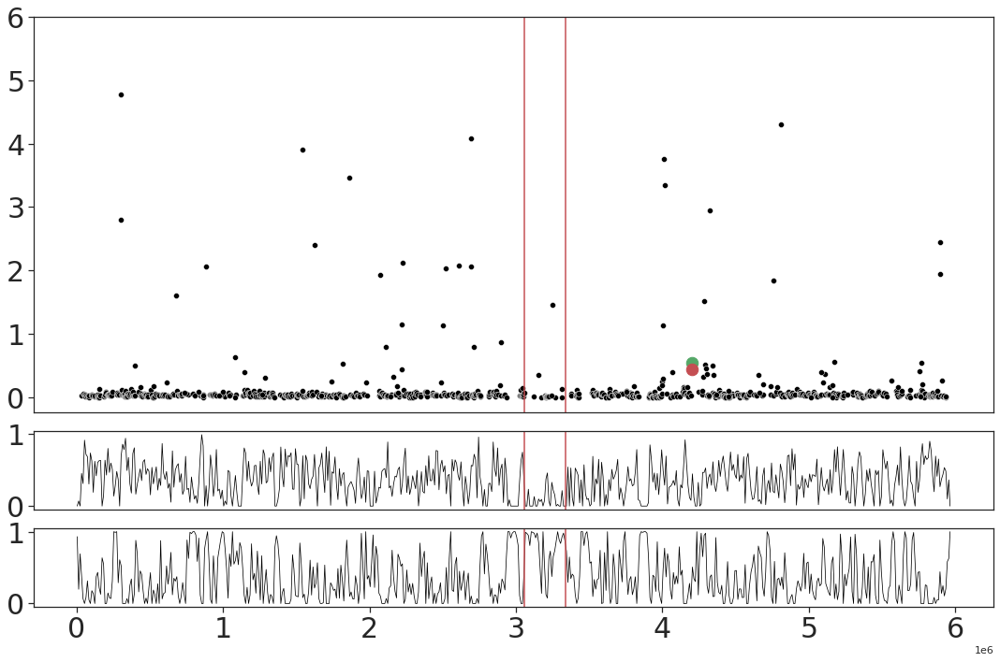

In [19]:
#f, axs = plt.subplots(2, 1, sharex=True, figsize=(15,10), gridspec_kw=dict(height_ratios=[5,0.5]))

f, axs = plt.subplots(3, 1, sharex=True, figsize=(15,10), gridspec_kw=dict(height_ratios=[5,1,1]))


g1 = sns.scatterplot(data=allele_df_HD,x='start',y='yn00_dS', ax=axs[0], legend=False, color='black')
sns.set()
sns.set_style('white')
g1.set_xlabel("Loci (bp) ")
#g1.set_ylabel("synonymous divergence rate", fontsize=20)
#g1.text(allele_df_HD.start[allele_df_HD.Target=='Pgt_21B_12336'],allele_df_HD.yn00_dS[allele_df_HD.Target=='Pgt_21B_12336']+0.1,"bE-HD", color='green', fontsize = 20, style='italic')
#g1.text(allele_df_HD.start[allele_df_HD.Target=='Pgt_21B_12337']+120000,allele_df_HD.yn00_dS[allele_df_HD.Target=='Pgt_21B_12337'],"bW-HD", color='red', fontsize = 20, style='italic')
g1.tick_params(axis='both', which='major', labelsize=20)
g1.plot(allele_df_HD.start[allele_df_HD.Target=='Pgt_21B_12336'],allele_df_HD.yn00_dS[allele_df_HD.Target=='Pgt_21B_12336'],'g.', markersize=25)
g1.plot(allele_df_HD.start[allele_df_HD.Target=='Pgt_21B_12337'],allele_df_HD.yn00_dS[allele_df_HD.Target=='Pgt_21B_12337'],'r.', markersize=25)
g1.tick_params(axis='both', which='major', labelsize=30)
g1.vlines([centromere.start[centromere.Contig == 'chr_4'], centromere.end[centromere.Contig == 'chr_4']], 0, 1, transform=g1.get_xaxis_transform(), colors='r')
tick_spacing = 1
g1.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))


g2 = sns.lineplot(x="1/2 position", y="Gene density", data=gene_density_chr4_A, ax=axs[1], size=1, legend=False, color='black')
g2.tick_params(bottom=False)
g2.set(xlabel=None)
g2.set_xlabel("Gene position along chromosome 4A", fontsize=20)
g2.title.set_position([0, 1.1])
g2.yaxis.labelpad = 15
#g2.set_ylabel("Gene density", fontsize=20)
#plt.figure(figsize=(15,0.5))
g2.ticklabel_format(axis="x", style="sci")
g2.tick_params(axis='both', which='major', labelsize=30)
g2.vlines([centromere.start[centromere.Contig == 'chr_4'], centromere.end[centromere.Contig == 'chr_4']], 0, 1, transform=g2.get_xaxis_transform(), colors='r')


g3 = sns.lineplot(x="1/2 position", y="TE density", data=TE_density_chr4_A, ax=axs[2], size=1, legend=False, color='black')
g3.tick_params(bottom=False)
g3.set(xlabel=None)
#g3.set_xlabel("Gene position along chromosome 4A", fontsize=20)
g3.title.set_position([0, 1.1])
g3.yaxis.labelpad = 15
#g3.set_ylabel("TE", fontsize=20)
#plt.figure(figsize=(15,0.5))
g3.ticklabel_format(axis="x", style="sci")
g3.tick_params(axis='both', which='major', labelsize=30)
g3.vlines([centromere.start[centromere.Contig == 'chr_4'], centromere.end[centromere.Contig == 'chr_4']], 0, 1, transform=g3.get_xaxis_transform(), colors='r')
g1.set_ylabel("")
g2.set_ylabel("")
g3.set_ylabel("")
tick_spacing = 1
g1.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
g1.tick_params(left=True)
g2.tick_params(left=True)
g3.tick_params(left=True)
g3.tick_params(bottom=True)
g1.axis(ymax=6)
#f.suptitle("dS value of genes on Pgt 210 chr4", x=0.2, y=0.98, fontsize=23, fontweight="bold")

f.tight_layout()
plt.subplots_adjust(hspace = 0.1)
plt.show()

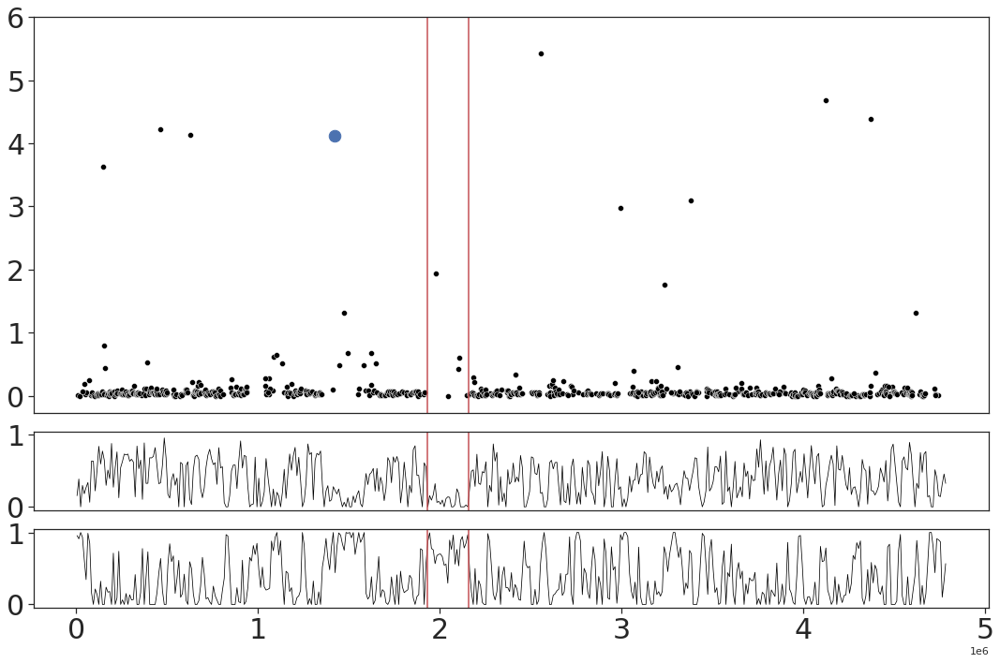

In [22]:
f, axs = plt.subplots(3, 1,sharex=True, figsize=(15,10), gridspec_kw=dict(height_ratios=[5,1,1]))

g1 = sns.scatterplot(data=allele_df_STE,x='start',y='yn00_dS', ax=axs[0], legend=False, color='black')
sns.set()
sns.set_style('white')
#g1.set_xlabel("Loci (bp) ")
#g1.set_ylabel("synonymous divergence rate", fontsize=20)
#g1.text(allele_df_STE.start[allele_df_STE.Target=='Pgt_21B_17723'],allele_df_STE.yn00_dS[allele_df_STE.Target=='Pgt_21B_17723'],"STE3.2 / STE3.3", color='red', fontsize = 20, style='italic')
g1.plot(allele_df_STE.start[allele_df_STE.Target=='Pgt_21B_17723'],allele_df_STE.yn00_dS[allele_df_STE.Target=='Pgt_21B_17723'],'b.', markersize=25)
g1.tick_params(axis='both', which='major', labelsize=30)
g1.axis(ymax=6)

g2 = sns.lineplot(x="1/2 position", y="Gene density", data=gene_density_chr9_A, ax=axs[1], size=1, legend=False, color='black')
g2.tick_params(bottom=False)
#g2.set_xlabel("Gene position along chromosome 9A", fontsize=20)
#g2.title.set_position([0, 1.1])
g2.yaxis.labelpad = 9
#g2.set_ylabel("Gene", fontsize=20)
#plt.figure(figsize=(15,0.5))
g2.ticklabel_format(axis="x", style="sci")
g2.tick_params(axis='both', which='major', labelsize=30)



g3 = sns.lineplot(x="1/2 position", y="TE density", data=TE_density_chr9_A, ax=axs[2], size=1, legend=False, color='black')
g3.tick_params(bottom=False)
g3.set(xlabel=None)
#g3.set_xlabel("Gene position along chromosome 9A", fontsize=20)
g3.title.set_position([0, 1.1])
g3.yaxis.labelpad = 15
#g3.set_ylabel("TE", fontsize=20)
#plt.figure(figsize=(15,0.5))
g3.ticklabel_format(axis="x", style="sci")
g3.tick_params(axis='both', which='major', labelsize=30)
g1.vlines([centromere.start[centromere.Contig == 'chr_9'], centromere.end[centromere.Contig == 'chr_9']], 0, 1, transform=g1.get_xaxis_transform(), colors='r')
g2.vlines([centromere.start[centromere.Contig == 'chr_9'], centromere.end[centromere.Contig == 'chr_9']], 0, 1, transform=g2.get_xaxis_transform(), colors='r')
g3.vlines([centromere.start[centromere.Contig == 'chr_9'], centromere.end[centromere.Contig == 'chr_9']], 0, 1, transform=g3.get_xaxis_transform(), colors='r')
g1.axis(ymax=6)
g1.set_ylabel("")
g2.set_ylabel("")
g3.set_ylabel("")
tick_spacing = 1
g1.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
g1.tick_params(left=True)
g2.tick_params(left=True)
g3.tick_params(left=True)
g3.tick_params(bottom=True)
#f.suptitle("dS value of genes on Pgt 210 chr9", x=0.2, y=0.98, fontsize=23, fontweight="bold")
f.tight_layout()
plt.subplots_adjust(hspace = 0.1)
plt.show()


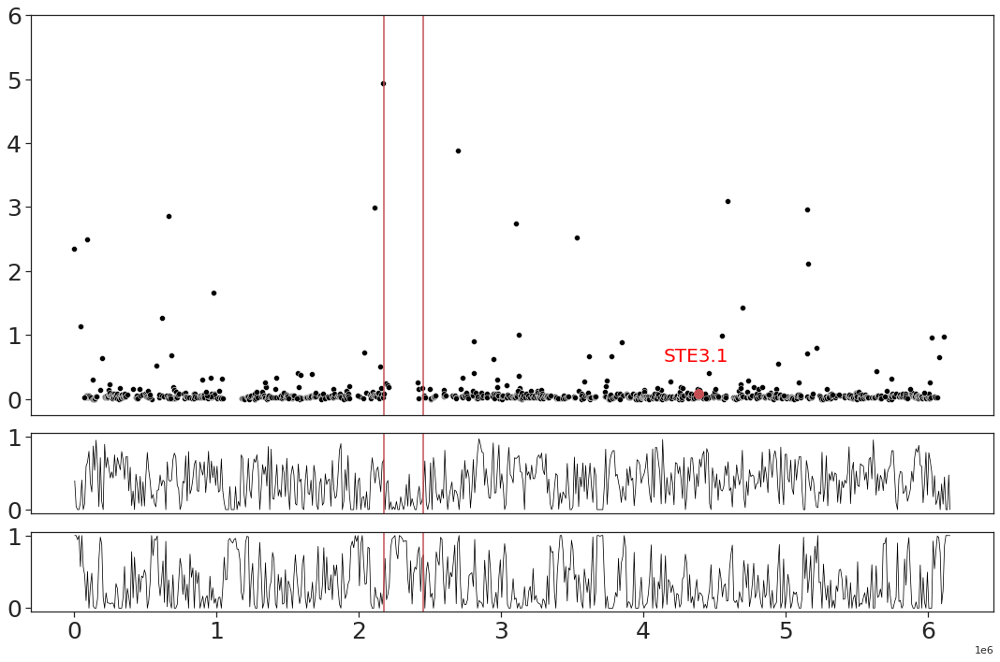

In [20]:
f, axs = plt.subplots(3, 1,sharex=True, figsize=(15,10), gridspec_kw=dict(height_ratios=[5,1,1]))

g1 = sns.scatterplot(data=allele_df_STE3_1,x='start',y='yn00_dS', ax=axs[0], legend=False, color='black')
sns.set()
sns.set_style('white')
#g1.set_xlabel("Loci (bp) ")
#g1.set_ylabel("synonymous divergence rate", fontsize=20)
g1.text(allele_df_STE3_1.start[allele_df_STE3_1.Target=='Pgt_21B_984']-250000,allele_df_STE3_1.yn00_dS[allele_df_STE3_1.Target=='Pgt_21B_984']+0.5,"STE3.1", color='red', size = 20)
g1.plot(allele_df_STE3_1.start[allele_df_STE3_1.Target=='Pgt_21B_984'],allele_df_STE3_1.yn00_dS[allele_df_STE3_1.Target=='Pgt_21B_984'],'r.', markersize=20)
g1.tick_params(axis='both', which='major', labelsize=25)

g2 = sns.lineplot(x="1/2 position", y="Gene density", data=gene_density_chr1_A, ax=axs[1], size=1, legend=False, color='black')
g2.tick_params(bottom=False)
g2.set(xlabel=None)
g2.title.set_position([0, 1.1])
#g2.set_xlabel("Gene position along chromosome 1A", fontsize=20)
g2.yaxis.labelpad = 15
g2.set_ylabel("Gene", fontsize=20)
#plt.figure(figsize=(15,0.5))
g2.ticklabel_format(axis="x", style="sci")
g2.tick_params(axis='both', which='major', labelsize=25)

g3 = sns.lineplot(x="1/2 position", y="TE density", data=TE_density_chr1_A, ax=axs[2], size=1, legend=False, color='black')
g3.tick_params(bottom=False)
g3.set(xlabel=None)
#g3.set_xlabel("Gene position along chromosome 1A", fontsize=20)
g3.title.set_position([0, 1.1])
g3.yaxis.labelpad = 15
#g3.set_ylabel("TE", fontsize=20)
#plt.figure(figsize=(15,0.5))
g3.ticklabel_format(axis="x", style="sci")
g3.tick_params(axis='both', which='major', labelsize=25)
g1.vlines([centromere.start[centromere.Contig == 'chr_1'], centromere.end[centromere.Contig == 'chr_1']], 0, 1, transform=g1.get_xaxis_transform(), colors='r')
g2.vlines([centromere.start[centromere.Contig == 'chr_1'], centromere.end[centromere.Contig == 'chr_1']], 0, 1, transform=g2.get_xaxis_transform(), colors='r')
g3.vlines([centromere.start[centromere.Contig == 'chr_1'], centromere.end[centromere.Contig == 'chr_1']], 0, 1, transform=g3.get_xaxis_transform(), colors='r')
g1.set_ylabel("")
g2.set_ylabel("")
g3.set_ylabel("")
tick_spacing = 1
g1.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
g1.tick_params(left=True)
g2.tick_params(left=True)
g3.tick_params(left=True)
g3.tick_params(bottom=True)
g1.axis(ymax=6)

#f.suptitle("dS value of genes on Pgt 210 chr1", x=0.2, y=0.98, fontsize=23, fontweight="bold")
f.tight_layout()
plt.subplots_adjust(hspace = 0.1)
plt.show()